<h1 align="center">MSIN0143: Programming for Business Analytics</h1>
<h1 align="center">Group Coursework by Team B2</h1>
<h1 align="center">Exploring Determinants of Success in the FIFA Football World Cup 2018
<br><br>
<h3 align="center">Word Count: 1940</h3>

## Table of Contents

* [Chapter 1](#chapter1): Introduction
* [Chapter 2](#chapter2): Data desciption and explanatory analysis of final datasets
* [Chapter 3](#chapter3): Data preparation
    * [3.1](#3_1): Acquiring and loading the datasets
        * [3.1.1](#3_1_1): Football
        * [3.1.2](#3_1_1): Temperature
        * [3.1.3](#3_1_1): Market Value
    * [3.2](#3_2): Data cleaning
        * [3.2.1](#3_1_1): Football
            * [3.2.1.1](#3_2_1_1): Summary table
            * [3.2.1.2](#3_1_2): Pass table
            * [3.2.1.3](#3_2_1_3): Positional table
        * [3.2.2](#3_1_1): Temperature
        * [3.2.3](#3_1_1): Market Value
* [Chapter 4](#chapter4): Regressions
    * [4.1](#4_1): Football performance variables
    * [4.2](#4_2): Temperature and market value variables
* [Chapter 5](#chapter5): Data visualisations
    * [5.1](#5_1): Histograms: football variables
    * [5.2](#5_2): World map: temperature difference per country compared to Russia
    * [5.3](#5_3): Rankings: radar chart for ball possessions
    * [5.4](#5_4): Decision trees
* [Chapter 6](#chapter6): Evaluation & limitations
* [Chapter 7](#chapter7): Conclusion
* [Chapter 8](#chapter8): References
* [Chapter 9](#chapter9): Appendix: project management
    * [9.1](#9_1): Trello board
    * [9.2](#9_2): Room bookings
    * [9.3](#9_3): Minutes of the meetings
    * [9.4](#9_4): Word count proof

## Chapter 1: <a class="anchor" id="chapter1"></a> Introduction

Football is the most popular sport in the world, with an estimated following of 4 billion fans (Shvili, 2020) and it has the power to unite people around the world in solidarity and togetherness (McKeown, Roy and Spandler, 2015). This is evidenced by the 2018 World Cup, which recorded $4.64 billion in revenue with a total attendance of 3,031,768 (Statista, 2018).

Therefore, predicting the factors that influence the success of the winning team at the World Cup, with the aid of notational analysis would be highly valuable, as countries can identify targeted areas of improvement, to increase their chances of success.

## Chapter 2: <a class="anchor" id="chapter2"></a> Data description and explanatory analysis of final datasets

We performed preliminary analysis (summary and descriptive statistics) on the data, which covered the market value of players, match analysis statistics and the weather conditions (temperature). Thereafter, we performed regression analysis to identify the effects of these variables on the success of a country's performance at the 2018 World Cup. We also developed decision trees and visualised key data.

<b>The football dataset</b> was obtained from Whoscored.com (2021). It had 32 rows (one for each country which participated) and 42 columns. It covers key performance indicators of the match (i.e. number of shots per game, number of dribbles won, penalties given, etc.). All the variables are explained in the <b>Variable Description Table</b> below. 

In [96]:
all_football_18 = pd.read_csv('/project/all_football_18.csv', index_col=0)
all_football_18.head()

,country_name,Final_positional_ranking,goal,shotsPerGame,yellow_card,red_card,possession_percentage,passSuccess_percentage,shotOnTargetPG,dribbleWonPG,...,keyPassShort,left_side,middle_side,right_side,own_third,middle_third,opposition_third,shot_left_side,shot_middle_side,shot_right_side
0,Argentina,16,6,13.8,11,0,61.1,85.0,4.5,13.5,...,8.8,38%,27%,35%,19%,49%,32%,27%,49%,24%
1,Australia,25,2,11.0,7,0,50.9,83.7,2.3,11.0,...,6.3,35%,20%,45%,27%,47%,25%,9%,79%,12%
2,Belgium,3,16,15.1,11,0,52.1,86.3,5.7,13.3,...,10.6,34%,26%,40%,27%,47%,26%,26%,56%,18%
3,Brazil,5,8,20.8,7,0,56.8,87.9,8.0,14.8,...,13.0,43%,29%,29%,25%,44%,31%,28%,60%,13%
4,Colombia,10,6,9.8,9,1,50.2,79.9,3.3,7.8,...,5.0,33%,22%,45%,29%,48%,23%,7%,66%,27%


<b>The Market Value dataset</b> was obtained from Transfermarkt.de (2021) and Martin (2018). We examined the market value, the number of players in the team and the average age of the players for each country. Thereafter, with the use of feature engineering, we generated a new variable (avg_market_value_of_players), by dividing the market value with the squad size. This new variable provides context on the average market value of each player and would be used to infer whether salary earnings is a key determinant of success in the games.

In [97]:
market_value_all.head()

,country,confederation,squad_size,avg_age,market_value_in_euros,market_value_digits,avg_market_value_of_players_in_mill_euros
0,Argentina,CONMEBOL,36,25.9,747.50 million,747,20.75
1,Australia,AFC,23,25.6,32.85 million,32,1.39
2,Belgium,UEFA,23,27.8,419.00 million,419,18.22
3,Brazil,CONMEBOL,23,26.5,870.50 million,870,37.83
4,Colombia,CONMEBOL,26,28.5,282.95 million,282,10.85


<b>For the Average Temperature dataset</b>, two datasets were obtained and merged (because of missing data), from Akshaychavan (Kaggle, 2016) and Subham Surana (Kaggle, 2020). We had to merge the two datasets together and convert all units to celcius.  A new variable 'TemperatureDifference' was generated by deducting the average temperature of each country from the average temperature of Russia, which is where the match was played. The purpose of the new variable - differences in temperature between their training locations (based on the assumption that they trained in their home country) and where the FIFA match was played - was to ascertain if this affected their performance.

In [133]:
temp_diff.head()

,Unnamed: 0,Country,AvgTemperature,TemperatureDifference
0,0,Argentina,9.730419,-8.818761
1,1,Australia,11.830601,-6.718579
2,2,Belgium,19.479053,0.929872
3,3,Brazil,19.686096,1.136916
4,4,Colombia,13.899818,-4.649362


A <b>summary statistics table</b> and a <b>variables table</b> was created for each of the three dataframes.

In [98]:
# Summary statistics for football
all_football_18stats = all_football_18.describe()
all_football_18stats.loc["skew",] = all_football_18.skew(axis = 0, skipna = True)
all_football_18stats.loc["kurtosis",] = all_football_18.kurtosis(axis = 0, skipna = True)
all_football_18stats = all_football_18stats.drop(["count", "min", "25%", "50%", "75%", "max"])
all_football_18stats.round(1)

,Final_positional_ranking,goal,shotsPerGame,yellow_card,red_card,possession_percentage,passSuccess_percentage,shotOnTargetPG,dribbleWonPG,foulGivenPG,...,assistThroughball,assistFreekick,assistOther,assist,passLongBallAccurate,passLongBallInaccurate,shortPassAccurate,shortPassInaccurate,keyPassLong,keyPassShort
mean,16.5,5.3,12.4,6.8,0.1,49.4,80.4,3.8,9.8,12.7,...,0.1,0.1,0.4,0.7,28.7,29.3,335.0,51.9,1.7,7.1
std,9.4,4.1,3.5,3.3,0.3,7.9,5.9,1.4,2.8,2.5,...,0.1,0.1,0.3,0.5,5.6,6.7,114.5,6.9,0.7,2.7
skew,0.0,1.3,1.7,0.3,2.4,0.3,-0.9,1.3,0.4,-0.2,...,2.0,3.3,0.1,0.2,0.8,-0.8,0.8,-0.2,0.4,1.6
kurtosis,-1.2,0.9,3.3,-0.1,3.9,0.3,1.5,2.7,-0.6,0.7,...,2.5,12.3,-1.2,-0.7,-0.1,0.8,1.5,-0.6,-0.2,4.3


In [135]:
# Summary statistics for each countries' temperature
temp_diffstats = temp_diff.describe()
temp_diffstats.loc["skew",] = temp_diff.skew(axis = 0, skipna = True)
temp_diffstats.loc["kurtosis",] = temp_diff.kurtosis(axis = 0, skipna = True)
temp_diffstats = temp_diffstats.drop(["count", "min", "25%", "50%", "75%", "max"])
temp_diffstats.round(1)

,Unnamed: 0,AvgTemperature,TemperatureDifference
mean,15.5,20.2,1.7
std,9.4,6.1,6.1
skew,0.0,0.3,0.3
kurtosis,-1.2,0.8,0.8


In [136]:
# Summary statistics for market value
market_value_allstats = market_value_all.describe()
market_value_allstats.loc["skew",] = market_value_all.skew(axis = 0, skipna = True)
market_value_allstats.loc["kurtosis",] = market_value_all.kurtosis(axis = 0, skipna = True)
market_value_allstats = market_value_allstats.drop(["count", "min", "25%", "50%", "75%", "max"])
market_value_allstats.round(1)

,squad_size,avg_age,market_value_digits,avg_market_value_of_players_in_mill_euros
mean,25.5,27.3,313.2,12.5
std,3.1,1.1,297.1,12.2
skew,1.6,0.5,1.1,1.2
kurtosis,3.5,0.7,0.2,0.4


In [350]:
# Variable Description Table
variable_description_table = pd.read_excel("/project/Variable Table - Football Prog.xlsx",index_col = 0)
variable_description_table

,Variable,Unit,Data Type,Description
Variable Key,,,,
18_yard_box,shots taken from within the 18 yard box,proportion,float,the proportion of shots taken by each country ...
6_yard_box,shots taken from within the 6 yard box,proportion,float,the proportion of shots taken by each country ...
assist,total assits made per game,numeric,float,the total number of assists (that led to a goa...
assistCorner,assists made through corners per game,numeric,float,the average number of assists (that led to a g...
assistCross,assists made through crosses per game,numeric,float,the average number of assists (that led to a g...
assistFreekick,assists made through freekicks per game,numeric,float,the average number of assists (that led to a g...
assistOther,assists made through other means per game,numeric,float,the average number of assists (that led to a g...
assistThroughball,assists made through throughballs per game,numeric,float,the average number of assists (that led to a g...
clearanceTotal,total clearances,numeric,float,the total number of clearances made from each ...


In [99]:
#Percentage of outliers per column
q1 = all_football_18.quantile(0.25)
q3 = all_football_18.quantile(0.75)
iqr = q3 - q1
share_outliers = (((all_football_18 < (q1 - 1.5 * iqr)) | (all_football_18 > (q3 + 1.5 * iqr))).sum() / len(all_football_18))*100
share_outliers

<ipython-input-99-2118c6d3d5f6>:5: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  share_outliers = (((all_football_18 < (q1 - 1.5 * iqr)) | (all_football_18 > (q3 + 1.5 * iqr))).sum() / len(all_football_18))*100
<ipython-input-99-2118c6d3d5f6>:5: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  share_outliers = (((all_football_18 < (q1 - 1.5 * iqr)) | (all_football_18 > (q3 + 1.5 * iqr))).sum() / len(all_football_18))*100


Final_positional_ranking     0.000
assist                       0.000
assistCorner                 3.125
assistCross                  0.000
assistFreekick              18.750
assistOther                  0.000
assistThroughball           21.875
clearanceTotal               0.000
country_name                 0.000
dribbleWonPG                 0.000
duelAerialLost               0.000
duelAerialTotal              0.000
duelAerialWon                0.000
foulGivenPG                  0.000
foulsPG                      6.250
goal                         9.375
interceptionPG               0.000
keyPassLong                  0.000
keyPassShort                 6.250
left_side                    0.000
middle_side                  0.000
middle_third                 0.000
offsideGivenPG               3.125
opposition_third             0.000
own_third                    0.000
passLongBallAccurate         0.000
passLongBallInaccurate       3.125
passSuccess_percentage       3.125
possession_percentag

After investigation, for the purposes of this group project's analysis, outliers were not removed. This was because our dataset is relatively small and these outliers represent the discrepancies between the more and least succesful teams.

However, we can still see that important variables which include a pre-calculated average (such as shots per game) were close to a normal distribution.

In [ ]:
shotspergame = sns.boxplot(
    x = "shotsPerGame", 
    data = all_football_18,  
    color = "#E8E8E8", 
    linewidth=1, 
    width=0.75,
    flierprops = {"marker": 'o', 
                  "markerfacecolor": '#6082B6', 
                  "markersize": 3, 
                  "markeredgecolor": '#6082B6'}
)
shotspergame.set_yticks([])
shotspergame.set_xlim([1,10])
_ = shotspergame.set_xticks([2,4,6,8,10,12,14,16,18,20])
shotspergame.set_xlabel("Number of Shots Per Game")


plt.savefig("Box Plot of Shots Per Game.png")

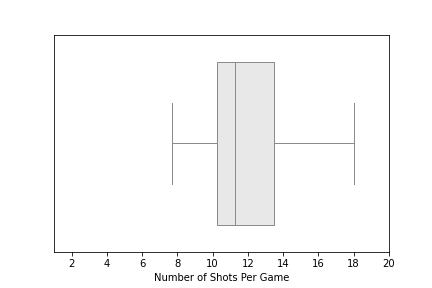

In [369]:
display(Image(filename="Box Plot of Shots Per Game.png"))

Figure 1: Box Plot of Shots Per Game

## Chapter 3: <a class="anchor" id="chapter2"></a> Data preparation

In [3]:
# Import necessary modules and libraries

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import numpy as np; np.random.seed(136)
import pandas as pd
from pandas import Series, DataFrame
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import faculty.datasets as datasets
from pandas.api.types import CategoricalDtype
import matplotlib.ticker as mtick
import statsmodels.api as sm
import plotly.graph_objects as go
from IPython.display import Image as image
from IPython.display import display
import os
from functools import reduce
vcvtype = 'nonrobust'
import itertools as it
import io
from nbformat import current

!pip install data-utilities
!pip install geopandas
import geopandas as gpd

### 3.1  <a class="anchor" id="3_1"></a> Acquiring and loading the datasets

Data preparation consisted of aquiring data, cleaning it and combining it.

<b>The Football dataset</b> required the most cleaning due to column names, country names, invalid signs and extra spaces. 
<br><b>The Market Value dataset</b> required to fix/find some missing values and the country names needed follow the same format as the other datasets. 
<br><b>The Average Temperature dataset</b> required to convert the temperature to Celcius. 

#### 3.1.1  <a class="anchor" id="3_1_1"></a> Football

The football dataset consists of three separate datasets (Summary, Pass & Positional) which were combined. 

In [10]:
#Loading the Summary csv files
summary_sum18 = pd.read_csv('/project/2018/1Summary/summarysum.csv', index_col = 0)
offensive_sum18 = pd.read_csv('/project/2018/1Summary/offensivesum.csv', index_col = 0)
defensive_sum18 = pd.read_csv('/project/2018/1Summary/defensivesum.csv', index_col = 0)
clearances_defensive_sum18 = pd.read_csv('/project/2018/1Summary/clearancesdefensivesum.csv', index_col = 0)
ariels_offensive_sum18 = pd.read_csv('/project/2018/1Summary/arielsoffensivesum.csv', index_col = 0)

In [90]:
summary_sum18.head()
offensive_sum18.head()
defensive_sum18.head()
clearances_defensive_sum18.head()
ariels_offensive_sum18.head()

,goal,shotsPerGame,yellow-card,red-card-,possession%,passSuccess%,aerialWonPG,stat-value
team-link,,,,,,,,
1. Belgium,16,15.1,11,0,52.1,86.3,13.7,7.06
2. Brazil,8,20.8,7,0,56.8,87.9,14.6,7.06
3. France,14,11.6,12,0,49.6,81.5,20.6,6.93
4. Croatia,14,16.1,15,0,55.4,81.2,27.6,6.92
5. Russia,11,9.6,6,1,39.5,71.0,30.6,6.85


,shotsPG,shotOnTargetPG,dribbleWonPG,foulGivenPG,stat-value
team-link,,,,,
1. Belgium,15.1,5.7,13.3,10.6,7.06
2. Brazil,20.8,8.0,14.8,14.4,7.06
3. France,11.6,4.1,11.0,14.7,6.93
4. Croatia,16.1,4.1,12.0,15.3,6.92
5. Russia,9.6,3.4,7.4,11.2,6.85


,shotsConcededPG,tacklePG,interceptionPG,foulsPG,offsideGivenPG,stat-value
team-link,,,,,,
1. Belgium,15.1,13.4,7.4,14.1,1.1,7.06
2. Brazil,8.4,17.6,12.0,9.8,1.8,7.06
3. France,9.3,16.7,10.3,13.1,0.4,6.93
4. Croatia,12.1,15.9,10.3,16.0,1.6,6.92
5. Russia,15.2,19.0,14.0,19.0,1.4,6.85


,clearanceTotal,stat-value
team-link,,
1. Belgium,16.9,7.06
2. Brazil,16.2,7.06
3. France,26.1,6.93
4. Uruguay,17.4,6.83
5. England,16.1,6.82


,duelAerialTotal,duelAerialWon,duelAerialLost,stat-value
team-link,,,,
1. Belgium,25.9,13.7,12.1,7.06
2. Brazil,30.2,14.6,15.6,7.06
3. France,36.6,20.6,16.0,6.93
4. Uruguay,38.4,17.8,20.6,6.83
5. England,38.3,23.9,14.4,6.82


In [11]:
#Loading the Pass Types csv files
assists_pass_type18 = pd.read_csv('/project/2018/3PassTypes/PassTypesAssists.csv')
key_passes_pass_type18 = pd.read_csv('/project/2018/3PassTypes/PassTypesKeyPasses.csv')
detailed_pass_type18 = pd.read_csv('/project/2018/3PassTypes/PassTypesPassDetailed.csv')

In [6]:
assists_pass_type18.head()
key_passes_pass_type18.head()
detailed_pass_type18.head()

,team-link,assistCross,assistCorner,assistThroughball,assistFreekick,assistOther,assist,stat-value
0,1. Belgium,0.4,0.0,0.4,0.0,0.9,1.7,7.06
1,2. Brazil,0.2,0.2,0.4,0.0,0.6,1.2,7.06
2,3. France,0.4,0.1,0.1,0.1,0.3,0.9,6.93
3,4. Uruguay,0.6,0.2,0.0,0.2,0.2,0.8,6.83
4,5. England,0.3,0.3,0.0,0.0,0.6,0.9,6.82


,team-link,keyPassesTotal,keyPassLong,keyPassShort,stat-value
0,1. Belgium,12.3,1.7,10.6,7.06
1,2. Brazil,16.2,3.2,13.0,7.06
2,3. France,8.3,0.9,7.4,6.93
3,4. Uruguay,8.0,1.8,6.2,6.83
4,5. England,9.3,2.7,6.6,6.82


,team-link,passTotal,passLongBallAccurate,passLongBallInaccurate,shortPassAccurate,shortPassInaccurate,stat-value
0,1. Belgium,515.7,24.7,21.9,420.3,48.9,7.06
1,2. Brazil,556.6,23.2,12.0,466.2,55.2,7.06
2,3. France,436.9,34.1,25.7,322.0,55.0,6.93
3,4. Uruguay,433.0,29.6,28.4,315.2,59.8,6.83
4,5. England,506.4,34.0,27.3,399.6,45.6,6.82


In [12]:
#Loading the Positional csv files
attack_sides_positional18 = pd.read_csv('/project/2018/4Positional/PositionalAttackSides.csv')
action_zones_positional18 = pd.read_csv('/project/2018/4Positional/PositionalActionZones.csv')
shot_directions_positional18 = pd.read_csv('/project/2018/4Positional/PositionalShotDirections.csv')
positional_shot_zones18 = pd.read_csv('/project/2018/4Positional/PositionalShotZones.csv')

In [94]:
attack_sides_positional18.head()
action_zones_positional18.head()
shot_directions_positional18.head()
positional_shot_zones18.head()

,team-link,left-side,middle-side,right-side
0,Spain,47%,24%,30%
1,Panama,44%,23%,33%
2,Croatia,43%,23%,34%
3,Brazil,43%,29%,29%
4,Portugal,42%,22%,36%


,team-link,own-third,middle-third,opposition-third
0,Iran,34%,47%,20%
1,South Korea,34%,41%,25%
2,Egypt,33%,43%,24%
3,Sweden,32%,44%,24%
4,Peru,31%,46%,23%


,team-link,shot-left-side,shot-middle-side,shot-right-side
0,Brazil,28%,60%,13%
1,Argentina,27%,49%,24%
2,Belgium,26%,56%,18%
3,Costa Rica,25%,57%,18%
4,Egypt,25%,61%,14%


,team-link,6-yard-box,18-yard-box,outside-box
0,Brazil,13%,48%,39%
1,England,12%,53%,35%
2,Poland,10%,52%,39%
3,Spain,9%,57%,34%
4,Uruguay,8%,48%,44%


#### 3.1.2  <a class="anchor" id="3_1_2"></a> Temperature

In [13]:
#Loading the Temperature Dataset
dailytem = pd.read_csv('/project/city_temperature.csv', low_memory=False)
dailytem.head()

,Region,Country,State,City,Month,Day,Year,AvgTemperature
0,Africa,Algeria,NaN,Algiers,1,1,1995,64.2
1,Africa,Algeria,NaN,Algiers,1,2,1995,49.4
2,Africa,Algeria,NaN,Algiers,1,3,1995,48.8
3,Africa,Algeria,NaN,Algiers,1,4,1995,46.4
4,Africa,Algeria,NaN,Algiers,1,5,1995,47.9


#### 3.1.3  <a class="anchor" id="3_1_3"></a> Market value

In [82]:
#Loading the Market Value Dataset
market_value = pd.read_csv('/project/market_value.csv')
market_value.head()

,#,country,confederation,squad_size 2,avg_age 3,market_value
0,1,England,UEFA,25th,25.4,€ 1.23 billion
1,2,France,UEFA,24,27.3,€ 978.80 million
2,3,Brazil,CONMEBOL,23,26.5,€ 870.50 million
3,4th,Portugal,UEFA,23,27.3,€ 775.00 million
4,5,Argentina,CONMEBOL,36,25.9,€ 747.50 million


### 3.2  <a class="anchor" id="3_2"></a> Data cleaning

The next step is to clean and format the three datasets.

#### 3.2.1  <a class="anchor" id="3_2_1"></a> Football

Firstly, the summary tables were cleaned.

##### 3.2.1.1  <a class="anchor" id="3_2_1_1"></a> Summary table

In [15]:
#For each table, we are doing the following cleaning steps:
#1) Reseting the index as the index was the team-link and 
# we want it to be a column
#2) Renaming the column from team-link to country_name 
# (easier to use it)
#3) splitting the country_name column to separate it from the . 
# and then dropping the second column created called "name"

summary_sum18 = summary_sum18.reset_index()
summary_sum18 = summary_sum18.rename(columns={"team-link": "country_name"})
summary_sum18[['number','country_name']] = summary_sum18.country_name.str.split(".",expand=True,)
summary_sum18 = summary_sum18.drop(columns=["number"])

offensive_sum18 = offensive_sum18.reset_index()
offensive_sum18 = offensive_sum18.rename(columns={"team-link": "country_name"})
offensive_sum18[['number','country_name']] = offensive_sum18.country_name.str.split(".",expand=True,)
offensive_sum18 = offensive_sum18.drop(columns=["number"])

defensive_sum18 = defensive_sum18.reset_index()
defensive_sum18 = defensive_sum18.rename(columns={"team-link": "country_name"})
defensive_sum18[['number','country_name']] = defensive_sum18.country_name.str.split(".",expand=True,)
defensive_sum18 = defensive_sum18.drop(columns=["number"])

clearances_defensive_sum18 = clearances_defensive_sum18.reset_index()
clearances_defensive_sum18 = clearances_defensive_sum18.rename(columns={"team-link": "country_name"})
clearances_defensive_sum18[['number','country_name']] = clearances_defensive_sum18.country_name.str.split(".",expand=True,)
clearances_defensive_sum18 = clearances_defensive_sum18.drop(columns=["number"])

ariels_offensive_sum18 = ariels_offensive_sum18.reset_index()
ariels_offensive_sum18 = ariels_offensive_sum18.rename(columns={"team-link": "country_name"})
ariels_offensive_sum18[['number','country_name']] = ariels_offensive_sum18.country_name.str.split(".",expand=True,)
ariels_offensive_sum18 = ariels_offensive_sum18.drop(columns=["number"])

In [16]:
# Here we make a list with all the dataframes we want to merge 
# Then we merge them all in a variable called all_summary18
data_frames = [summary_sum18, offensive_sum18, defensive_sum18, clearances_defensive_sum18, ariels_offensive_sum18]
all_summary18 = reduce(lambda  left,right: pd.merge(left,right,on=['country_name'],
                                            how='inner'), data_frames)

In [17]:
# After merging, we can see that some tables had the same column 
# called "stat-value"
# we can then proceed in dropping two of them and keeping the 
# third one as same columns.
all_summary18 = all_summary18.drop(columns=["stat-value_x","stat-value_y"])

#there are also some columns where their name format is not ideal 
#so we proceeded in updating them 
all_summary18 = all_summary18.rename(columns={"yellow-card":"yellow_card", 
                                              "red-card-":"red_card",
                                             "possession%":"possession_percentage",
                                             "passSuccess%":"passSuccess_percentage"})

In [18]:
# To be easier to merge the tables with each other, 
# we sorted them alphabetically based on their country_name

all_summary18 = all_summary18.sort_values("country_name")
all_summary18 = all_summary18.reset_index(drop=True)

# we also want to remove the space from the country_name to be easier to use
# from ' Argentina' to 'Argentina'
all_summary18["country_name"] = [x.strip() for x in all_summary18['country_name']]

In [19]:
# checking for null values in the all_summary18 dataframe; 
# the output implies clean dataset
all_summary18.isnull().sum()

country_name              0
goal                      0
shotsPerGame              0
yellow_card               0
red_card                  0
possession_percentage     0
passSuccess_percentage    0
aerialWonPG               0
shotsPG                   0
shotOnTargetPG            0
dribbleWonPG              0
foulGivenPG               0
shotsConcededPG           0
tacklePG                  0
interceptionPG            0
foulsPG                   0
offsideGivenPG            0
clearanceTotal            0
duelAerialTotal           0
duelAerialWon             0
duelAerialLost            0
stat-value                0
dtype: int64

##### 3.2.1.2 <a class="anchor" id="3_2_1_2"></a> Pass table

In [20]:
#Secondly, the pass tables were cleaned
#For each table, we are doing the following cleaning steps:
#1) renaming the column from team-link to country_name (easier to use it)
#2) splitting the country_name column

assists_pass_type18 = assists_pass_type18.rename(columns={"team-link": "country_name"})
assists_pass_type18[['number','country_name']] = assists_pass_type18.country_name.str.split(".",expand=True,)
assists_pass_type18 = assists_pass_type18.drop(columns=["number"])

key_passes_pass_type18 = key_passes_pass_type18.rename(columns={"team-link": "country_name"})
key_passes_pass_type18[['number','country_name']] = key_passes_pass_type18.country_name.str.split(".",expand=True,)
key_passes_pass_type18 = key_passes_pass_type18.drop(columns=["number"])

detailed_pass_type18 = detailed_pass_type18.rename(columns={"team-link": "country_name"})
detailed_pass_type18[['number','country_name']] = detailed_pass_type18.country_name.str.split(".",expand=True,)
detailed_pass_type18 = detailed_pass_type18.drop(columns=["number"])

In [21]:
# here we make a list with all the dataframes we want to merge a
# we then merge them all in a variable called all_pass18
data_frames2 = [assists_pass_type18, detailed_pass_type18,key_passes_pass_type18]
all_pass18 = reduce(lambda  left,right: pd.merge(left,right,on=['country_name'],
                                            how='inner'), data_frames2)

In [22]:
# after merging, we can see that some tables had the same column called "stat-value"
# we can then proceed in dropping all of them as it's the same stat-value
# as in all_summary18 df.
all_pass18 = all_pass18.drop(columns=["stat-value_x","stat-value_y","stat-value"])

In [23]:
# In order to be easier to merge the tables with each other, we sorted them 
# alphabetically based on their country_name

all_pass18 = all_pass18.sort_values("country_name")
all_pass18 = all_pass18.reset_index(drop=True)

# we also want to remove the space from the country_name to be easier to use
# from ' Argentina' to 'Argentina'
all_pass18["country_name"] = [x.strip() for x in all_pass18['country_name']]

In [24]:
# checking for null values in the all_pass18 dataframe
all_pass18.isnull().sum()
# the output implies clean dataset

country_name              0
assistCross               0
assistCorner              0
assistThroughball         0
assistFreekick            0
assistOther               0
assist                    0
passTotal                 0
passLongBallAccurate      0
passLongBallInaccurate    0
shortPassAccurate         0
shortPassInaccurate       0
keyPassesTotal            0
keyPassLong               0
keyPassShort              0
dtype: int64

##### 3.2.1.3 <a class="anchor" id="3_2_1_3"></a> Positional table

In [25]:
# We make a list with all the dataframes we want to merge and allocate
# We merge them all in a variable called all_positions18
data_frames3 = [attack_sides_positional18, action_zones_positional18,shot_directions_positional18]
all_positions18 = reduce(lambda  left,right: pd.merge(left,right,on=['team-link'],
                                            how='inner'), data_frames3)

In [26]:
#replace all dashes with underscore symbol to be easier to use 
all_positions18.columns = all_positions18.columns.str.replace('-','_')

#rename team_link with country_name to be consistent with the other dataframes
all_positions18 = all_positions18.rename(columns={"team_link": "country_name"})

In [27]:
# In order to be easier to merge the tables with each other, we sorted them 
# alphabetically based on their country_name

all_positions18 = all_positions18.sort_values("country_name")
all_positions18 = all_positions18.reset_index(drop=True)

# we also want to remove the space from the country_name to be easier to use
# from ' Argentina' to 'Argentina'
all_positions18["country_name"] = [x.strip() for x in all_positions18['country_name']]

In [97]:
# we result in all 3 of the marged dataframes which have the same format
all_summary18.head()
all_pass18.head()
all_positions18.head()

,country_name,goal,shotsPerGame,yellow_card,red_card,possession_percentage,passSuccess_percentage,aerialWonPG,shotsPG,shotOnTargetPG,...,shotsConcededPG,tacklePG,interceptionPG,foulsPG,offsideGivenPG,clearanceTotal,duelAerialTotal,duelAerialWon,duelAerialLost,stat-value
0,Argentina,6,13.8,11,0,61.1,85.0,18.3,13.8,4.5,...,10.0,16.5,7.8,14.0,1.5,18.5,35.8,18.3,17.5,6.57
1,Australia,2,11.0,7,0,50.9,83.7,20.3,11.0,2.3,...,8.7,15.0,8.0,12.7,1.0,23.7,36.3,20.3,16.0,6.47
2,Belgium,16,15.1,11,0,52.1,86.3,13.7,15.1,5.7,...,15.1,13.4,7.4,14.1,1.1,16.9,25.9,13.7,12.1,7.06
3,Brazil,8,20.8,7,0,56.8,87.9,14.6,20.8,8.0,...,8.4,17.6,12.0,9.8,1.8,16.2,30.2,14.6,15.6,7.06
4,Colombia,6,9.8,9,1,50.2,79.9,21.8,9.8,3.3,...,11.5,15.8,9.0,15.8,1.8,24.0,44.3,19.3,25.0,6.76


,country_name,assistCross,assistCorner,assistThroughball,assistFreekick,assistOther,assist,passTotal,passLongBallAccurate,passLongBallInaccurate,shortPassAccurate,shortPassInaccurate,keyPassesTotal,keyPassLong,keyPassShort
0,Argentina,0.3,0.0,0.3,0.0,0.8,1.3,583.8,22.0,25.5,474.3,62.0,9.5,0.8,8.8
1,Australia,0.0,0.0,0.0,0.0,0.0,0.0,479.0,25.7,28.7,375.3,49.3,8.0,1.7,6.3
2,Belgium,0.4,0.0,0.4,0.0,0.9,1.7,515.7,24.7,21.9,420.3,48.9,12.3,1.7,10.6
3,Brazil,0.2,0.2,0.4,0.0,0.6,1.2,556.6,23.2,12.0,466.2,55.2,16.2,3.2,13.0
4,Colombia,0.5,0.5,0.5,0.0,0.3,1.3,427.5,27.5,31.5,314.8,53.8,6.5,1.5,5.0


,country_name,left_side,middle_side,right_side,own_third,middle_third,opposition_third,shot_left_side,shot_middle_side,shot_right_side
0,Argentina,38%,27%,35%,19%,49%,32%,27%,49%,24%
1,Australia,35%,20%,45%,27%,47%,25%,9%,79%,12%
2,Belgium,34%,26%,40%,27%,47%,26%,26%,56%,18%
3,Brazil,43%,29%,29%,25%,44%,31%,28%,60%,13%
4,Colombia,33%,22%,45%,29%,48%,23%,7%,66%,27%


We then made heatmaps to see the correlation between the variables and decide if any need to be dropped.

Text(0.5, 1.0, 'Correlation Matrix for summary football')

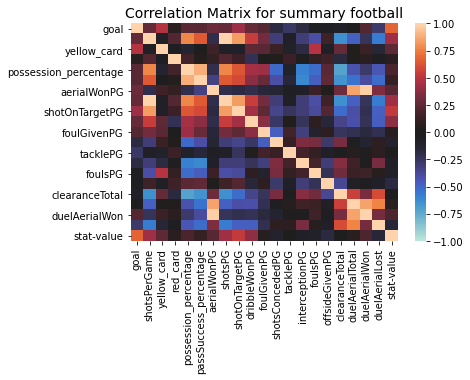

In [28]:
# First correlation matrix for the data in all_summary_18 dataset
dfCorr1 = pd.DataFrame(all_summary18)

corrMatrix1 = dfCorr1.corr()
ax = sns.heatmap(corrMatrix1,annot=False, vmin=-1, vmax=1, center=0)
ax.set_title("Correlation Matrix for summary football", fontsize = 14)

_ = ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0,
    horizontalalignment='right')

plt.savefig("Correlation Matrix for summary football.png")

Figure 2: Correlation Matrix for Summary Football

From correlation matrix above, we can see that there are some columns showing the same thing. For example, *shotsPG* and *shotsPerGame* and also *aerialwonPG* and *duelAerialWon*. Therefore, we proceeded in dropping them.

In [29]:
all_summary18 = all_summary18.drop(columns={"shotsPG", "aerialWonPG"})

Text(0.5, 1.0, 'Correlation Matrix for pass football')

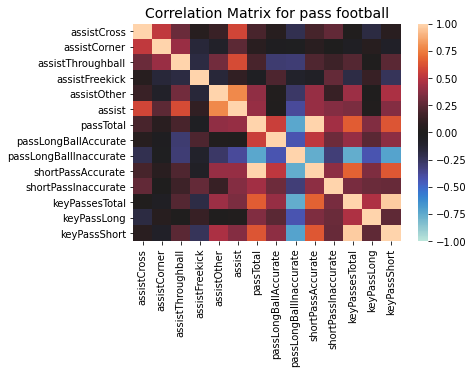

In [30]:
# Second correlation matrix for the data in all_pass18 dataset
dfCorr2 = pd.DataFrame(all_pass18)

corrMatrix2 = dfCorr2.corr()
ax = sns.heatmap(corrMatrix2,annot=False, vmin=-1, vmax=1, center=0)
ax.set_title("Correlation Matrix for pass football", fontsize = 14)

plt.savefig("Correlation Matrix for pass football.png")

Figure 3: Correlation Matrix for Pass Football

In [31]:
# further columns were dropped due to a high correlation between variables
all_pass18 = all_pass18.drop(columns={"keyPassesTotal", "passTotal"})

We then merged the three dataframes we had made and cleaned (all_summary18, all_pass18, all_positions18) into one dataframe called <b>all_football_18</b> for more effective analysis.

In [43]:
# below we are going to merge our 3 main dataframes into 1.
# The variable will be called all_football_18
data_frames4 = [all_summary18, all_pass18, all_positions18]
all_football_18 = reduce(lambda left,right: pd.merge(left,right,on=['country_name'],
                                            how='inner'), data_frames4)

We then proceeded to add the actual positional ranking for each country in 2018.

In [44]:
# loading the additional csv file
actual_ranking = pd.read_csv("Actual_Positional_Rankings_2018.csv")

In [45]:
# a column name was renamed for ease of use
actual_ranking = actual_ranking.rename(columns=({"Final positional ranking":"Final_positional_ranking"}))

In [46]:
# merge main dataframe on country name with the actual ranking

all_football_18 = pd.merge(all_football_18, actual_ranking, 
  left_on='country_name', 
  right_on='Team',
    how="right"
)
all_football_18 = all_football_18.sort_values(by=("country_name")).reset_index(drop=True)
all_football_18 = all_football_18.drop(columns=("Team"))

In [47]:
# We then moved the Final_positional_ranking column to be just after the country_name so
# that it can be easier for the analysis

my_list = list(all_football_18)
all_football_18 = all_football_18[['country_name', 'Final_positional_ranking',
 'goal',
 'shotsPerGame',
 'yellow_card',
 'red_card',
 'possession_percentage',
 'passSuccess_percentage',
 'shotOnTargetPG',
 'dribbleWonPG',
 'foulGivenPG',
 'shotsConcededPG',
 'tacklePG',
 'interceptionPG',
 'foulsPG',
 'offsideGivenPG',
 'clearanceTotal',
 'duelAerialTotal',
 'duelAerialWon',
 'duelAerialLost',
 'stat-value',
 'assistCross',
 'assistCorner',
 'assistThroughball',
 'assistFreekick',
 'assistOther',
 'assist',
 'passLongBallAccurate',
 'passLongBallInaccurate',
 'shortPassAccurate',
 'shortPassInaccurate',
 'keyPassLong',
 'keyPassShort',
 'left_side',
 'middle_side',
 'right_side',
 'own_third',
 'middle_third',
 'opposition_third',
 'shot_left_side',
 'shot_middle_side',
 'shot_right_side']]

In [49]:
# here is the head of the collated football dataset
all_football_18.head()

#to show all the variables
all_football_18.info()

,country_name,Final_positional_ranking,goal,shotsPerGame,yellow_card,red_card,possession_percentage,passSuccess_percentage,shotOnTargetPG,dribbleWonPG,...,keyPassShort,left_side,middle_side,right_side,own_third,middle_third,opposition_third,shot_left_side,shot_middle_side,shot_right_side
0,Argentina,16,6,13.8,11,0,61.1,85.0,4.5,13.5,...,8.8,38%,27%,35%,19%,49%,32%,27%,49%,24%
1,Australia,25,2,11.0,7,0,50.9,83.7,2.3,11.0,...,6.3,35%,20%,45%,27%,47%,25%,9%,79%,12%
2,Belgium,3,16,15.1,11,0,52.1,86.3,5.7,13.3,...,10.6,34%,26%,40%,27%,47%,26%,26%,56%,18%
3,Brazil,5,8,20.8,7,0,56.8,87.9,8.0,14.8,...,13.0,43%,29%,29%,25%,44%,31%,28%,60%,13%
4,Colombia,10,6,9.8,9,1,50.2,79.9,3.3,7.8,...,5.0,33%,22%,45%,29%,48%,23%,7%,66%,27%


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 42 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country_name              32 non-null     object 
 1   Final_positional_ranking  32 non-null     int64  
 2   goal                      32 non-null     int64  
 3   shotsPerGame              32 non-null     float64
 4   yellow_card               32 non-null     int64  
 5   red_card                  32 non-null     int64  
 6   possession_percentage     32 non-null     float64
 7   passSuccess_percentage    32 non-null     float64
 8   shotOnTargetPG            32 non-null     float64
 9   dribbleWonPG              32 non-null     float64
 10  foulGivenPG               32 non-null     float64
 11  shotsConcededPG           32 non-null     float64
 12  tacklePG                  32 non-null     float64
 13  interceptionPG            32 non-null     float64
 14  foulsPG     

In [ ]:
#### 3.2.2  <a class="anchor" id="3_2_2"></a> Temperature

In [50]:
# we dropped some uncessary columns, i.e. region, city, state 
# because we only need to know about country-level information
dailytem = dailytem.drop(columns = ['Region','State','City'])

In [51]:
# World Cup 2018 was hold between June and July
# so more accurate analysis of temperature would require only the months of 
# June-July 2018 would be kept for comparison
dailytem_2018 = dailytem[dailytem["Year"] == 2018]
dailytem_2018_6_7 = dailytem_2018[(dailytem_2018["Month"] == 6) | (dailytem_2018["Month"] == 7)]

In [52]:
# the mean was taken of the two months, and the the more granular data 
# was deleted as it was not necessary for this analysis
annualtem = dailytem_2018_6_7.groupby(["Country"]).mean()
annualtem = annualtem.drop(columns = ["Month","Day", "Year"])
annualtem = annualtem.reset_index()

In [53]:
# Only country on the World Cup list are needed for analysis
list_of_countries = list(all_football_18["country_name"])

In [54]:
# It could be found that Only 28 countries are in the list, so 4 countries are missing
missing_countries_tem = pd.merge(annualtem, all_football_18, 
  left_on='Country', 
  right_on='country_name',
    how="right"
)

missing_countries_tem= missing_countries_tem[missing_countries_tem.isna().any(axis=1)]

In [55]:
# "England", "Iran", "Peru", "Serbia" are missed in the sorted tem dataset
missing_name_reference = list(annualtem["Country"])

[t.split() for t in missing_name_reference if t.startswith(('United', 'Serbia', 'Persia', 'Pe'))]

# It can be found England exists in the dataframe with the name 

[['United', 'Arab', 'Emirates'], ['United', 'Kingdom']]

In [56]:
# Change the name 'United Kingdom' into 'England' in the dataset
annualtem['Country'] = annualtem['Country'].replace({'United Kingdom': 'England'})
# Regenerate new country list
countries_2018_6_7 = annualtem[annualtem["Country"].isin(list_of_countries)]
countries_2018_6_7 = countries_2018_6_7.reset_index(drop = True)
# Now there are 29 countries presented. Only 'Iran', 'Peru', 'Serbia' are missing
# the data of temperature of these three countries would be found to fill the missing value.

In [57]:
# With the relationship between Fahrenheit unit and Celsius unit T ℉ = 1.8t℃ + 32,
# so to convert the data unit into Celsius: t℃ = (T ℉-32)/1.8
countries_2018_6_7["AvgTemperature"] = (countries_2018_6_7["AvgTemperature"] - 32)/1.8

In [58]:
# For these three countries, the latest temperature data could be found is up to 2013.
yearlytem2013 = pd.read_csv('/project/matYearCountry.csv')
yearlytem2013 = yearlytem2013.loc[13, ['Peru', 'Iran', 'Serbia']]

In [59]:
# The missing values (countries) were then added, manually
addcountries = DataFrame({'Country':["Peru",'Iran', 'Serbia'], 'AvgTemperature': [19.976250, 20.541000, 12.843625]},)
countries_2018_6_7 = countries_2018_6_7.append(addcountries, ignore_index = True)

In [60]:
# Since the World Cup 2018 was held in Russia, the temperature difference between each country with Russia
# is supposed to be calculated to see if the change in temperature impacted the success of teams 
countries_2018_6_7["TemperatureDifference"] = countries_2018_6_7["AvgTemperature"] - countries_2018_6_7.loc[19,"AvgTemperature"]

In [64]:
# The temperature difference dataframe was exported as a CSV and assigned to a new variable (temp_diff) for ease of use.
countries_2018_6_7.to_csv("/project/temdifference.csv")
temp_diff = pd.read_csv("/project/temdifference.csv", index_col=0)

In [65]:
#showcasing the head of the final temperature dataframe
temp_diff.head()

,Country,AvgTemperature,TemperatureDifference
0,Argentina,9.730419,-8.818761
1,Australia,11.830601,-6.718579
2,Belgium,19.479053,0.929872
3,Brazil,19.686096,1.136916
4,Colombia,13.899818,-4.649362


#### 3.2.3  <a class="anchor" id="3_2_3"></a> Market Value

In [83]:
# Dropping unecessary columns
market_value = market_value.drop(columns=["#"])

# In order to be easier to use, we sorted the table alphabetically based on 
# the country column.
market_value = market_value.sort_values("country")
market_value = market_value.reset_index(drop=True)

In [84]:
# Extracting all the 32 countries from the WorldCup 
# and make a list with them in order to use them.
list_of_countries = list(all_football_18["country_name"])

In [85]:
# we want to get market value data only for the countries of the WorldCup
market_value_all = market_value[market_value['country'].isin(list_of_countries)]

market_value_all = market_value_all.reset_index(drop=True)
market_value_all

,country,confederation,squad_size 2,avg_age 3,market_value
0,Argentina,CONMEBOL,36,25.9,€ 747.50 million
1,Belgium,UEFA,23,27.8,€ 419.00 million
2,Brazil,CONMEBOL,23,26.5,€ 870.50 million
3,Colombia,CONMEBOL,26th,28.5,€ 282.95 million
4,Costa Rica,CONCACAF,23,26.4,"24,25 Mio. €"
5,Croatia,UEFA,26th,27.1,€ 317.00 million
6,Denmark,UEFA,30th,26.5,€ 289.30 million
7,England,UEFA,25th,25.4,€ 1.23 billion
8,France,UEFA,24,27.3,€ 978.80 million
9,Germany,UEFA,21,27.5,€ 572.00 million


We needed a total of 32 but we only got 26 so missing 6 countries.

To find out which countries are missing, we merged both tables with a "right" join so that we can see which countries from the all_football_18 dataset didn't have a match. The ones missing should have a NaN value.

In [86]:
missing_countries = pd.merge(market_value_all, all_football_18, 
  left_on='country', 
  right_on='country_name',
    how="right")

# by running below command, we want to display the rows which have NaN values to 
# see which countries they are.
missing_countries = missing_countries[missing_countries.isna().any(axis=1)]
missing_countries

,country,confederation,squad_size 2,avg_age 3,market_value,country_name,Final_positional_ranking,goal,shotsPerGame,yellow_card,...,keyPassShort,left_side,middle_side,right_side,own_third,middle_third,opposition_third,shot_left_side,shot_middle_side,shot_right_side
1,NaN,NaN,NaN,NaN,NaN,Australia,25,2,11.0,7,...,6.3,35%,20%,45%,27%,47%,25%,9%,79%,12%
8,NaN,NaN,NaN,NaN,NaN,Egypt,31,2,9.3,5,...,4.7,40%,25%,36%,33%,43%,24%,25%,61%,14%
12,NaN,NaN,NaN,NaN,NaN,Iceland,27,2,11.0,3,...,6.0,34%,31%,35%,29%,45%,25%,21%,58%,21%
18,NaN,NaN,NaN,NaN,NaN,Panama,32,2,8.0,11,...,5.3,44%,23%,33%,26%,54%,20%,24%,60%,16%
23,NaN,NaN,NaN,NaN,NaN,Saudi Arabia,29,2,12.3,1,...,7.0,35%,23%,42%,25%,51%,25%,22%,51%,27%
30,NaN,NaN,NaN,NaN,NaN,Tunisia,28,5,12.0,4,...,7.7,36%,22%,42%,29%,47%,23%,17%,61%,22%


In [87]:
# Below we are trying to find the names of these countries to see how they are written
missing_countries_name = list(market_value['country'])
[t.split() for t in missing_countries_name if t.startswith(('Austra','Saudi','Tune','Pan'))]
[t.split() for t in missing_countries_name if t.endswith(('ypten','land'))]

[['Australien'], ['Saudi-Arabien'], ['Tunesien']]

[['England'],
 ['Finnland'],
 ['Ireland'],
 ['Island'],
 ['Neuseeland'],
 ['Nordirland'],
 ['Poland'],
 ['Scotland'],
 ['Switzerland'],
 ['Ägypten']]

In [88]:
# Now that we found the names, we want to update them to match 
# the actual names we have
market_value['country'] = market_value['country'].replace({'Australien':'Australia',
                                                          'Ägypten':'Egypt',
                                                          'Island':'Iceland',
                                                          'Saudi-Arabien':'Saudi Arabia',
                                                          'Tunesien':'Tunisia'})

# and we will re run the command to go through the list of countries from the football
# dataset and only match the ones present in both
market_value_all = market_value[market_value['country'].isin(list_of_countries)]

market_value_all = market_value_all.reset_index(drop=True)

#to see how many rows we have now
len(market_value_all.index)

31

We needed a total of 32 but we only got 31. Panama is the missing one. After some research, we found data for Panama and we added it in.

In [89]:
#rename the columns by adding "in_euros" part, so that we can remove the € sign from the rows
market_value_all = market_value_all.rename(columns={"market_value":"market_value_in_euros",
                                                   "squad_size 2":"squad_size","avg_age 3":"avg_age"},)

# Cleaning the dataset by replacing some values:
# 1) replacing € with nothing (so basically removing it)
# 2) replacing , with . to keep the same format for the amounts
# 3) replacing "Mio." with "million" to keep the same format 
market_value_all.market_value_in_euros = market_value_all.market_value_in_euros.str.replace('€','')
market_value_all.market_value_in_euros = market_value_all.market_value_in_euros.str.replace(",",".")
market_value_all.market_value_in_euros = market_value_all.market_value_in_euros.str.replace("Mio.","million")


# We used str.extract to pass a regex pattern to extract just the numeric parts.
# the expand=False is added so that it doesn't add a new column.
market_value_all['squad_size'] = market_value_all['squad_size'].str.extract('(\d+)', expand=False)

<ipython-input-89-cf4c646a6152>:11: FutureWarning: The default value of regex will change from True to False in a future version.
  market_value_all.market_value_in_euros = market_value_all.market_value_in_euros.str.replace("Mio.","million")


In [90]:
#Data sources: 
#https://www.businessinsider.com/how-much-each-team-at-the-world-cup-is-worth-2018-6?r=US&IR=T#32-panama-1
#https://en.wikipedia.org/wiki/2018_FIFA_World_Cup_squads#Panama

new_row = {'country':'Panama', 'confederation':"CONCACAF", 'squad_size':23, 'avg_age':28.4, 'market_value_in_euros': "10.17 million"}
#append row to the dataframe
market_value_all = market_value_all.append(new_row, ignore_index=True)

len(market_value_all.index)

32

As a form of <b>feature engineering</b>, we are going to make a new variable by dividing the market value in euros with the squad size. This will allow us to find the average market value of players in euros for each team. This will be used later for a comparison to see if well paid players perform better.

In [91]:
# making a new column which only contains the digits of the column
market_value_all['market_value_digits'] = market_value_all['market_value_in_euros'].str.extract('(\d+)', expand=False)

# transforming both columns that we will divide to numeric
market_value_all["market_value_digits"] = pd.to_numeric(market_value_all['market_value_digits'])
market_value_all["squad_size"] = pd.to_numeric(market_value_all['squad_size'])

# we replace the value for England because it's billion and not million
market_value_all['market_value_digits'] = market_value_all['market_value_digits'].replace({1.0:1000})
market_value_all.info()

market_value_all['avg_market_value_of_players_in_mill_euros'] = market_value_all['market_value_digits']/market_value_all['squad_size']
market_value_all['avg_market_value_of_players_in_mill_euros'] = market_value_all['avg_market_value_of_players_in_mill_euros'].round(2) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   country                32 non-null     object 
 1   confederation          32 non-null     object 
 2   squad_size             32 non-null     int64  
 3   avg_age                32 non-null     float64
 4   market_value_in_euros  32 non-null     object 
 5   market_value_digits    32 non-null     int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 1.6+ KB


In [92]:
market_value_all.head()

,country,confederation,squad_size,avg_age,market_value_in_euros,market_value_digits,avg_market_value_of_players_in_mill_euros
0,Argentina,CONMEBOL,36,25.9,747.50 million,747,20.75
1,Australia,AFC,23,25.6,32.85 million,32,1.39
2,Belgium,UEFA,23,27.8,419.00 million,419,18.22
3,Brazil,CONMEBOL,23,26.5,870.50 million,870,37.83
4,Colombia,CONMEBOL,26,28.5,282.95 million,282,10.85


## Chapter 4: <a class="anchor" id="chapter4"></a> Regressions

Before creating any visualisations for the effect of football variables, we ran regressions with all the football variables to see which ones are most impactful ones. Our dependent variable (Y) was the Final_positional_ranking in order to see which variables significantly affected the final position of the teams.

### 4.1  <a class="anchor" id="4_1"></a> Football performance variables

In [100]:
#rename position columns to have the "percent"
all_football_18 = all_football_18.rename(columns={"left_side": "left_side_percent",
                                                 "middle_side":"middle_side_percent",
                                                 "right_side":"right_side_percent",
                                                 "own_third":"own_third_percent",
                                                 "middle_third":"middle_third_percent",
                                                 "opposition_third":"opposition_third_percent",
                                                 "shot_left_side":"shot_left_side_percent",
                                                 "shot_middle_side":"shot_middle_side_percent",
                                                 "shot_right_side":"shot_right_side_percent"})

,country_name,Final_positional_ranking,goal,shotsPerGame,yellow_card,red_card,possession_percentage,passSuccess_percentage,shotOnTargetPG,dribbleWonPG,...,keyPassShort,left_side_percent,middle_side_percent,right_side_percent,own_third_percent,middle_third_percent,opposition_third_percent,shot_left_side_percent,shot_middle_side_percent,shot_right_side_percent
0,Argentina,16,6,13.8,11,0,61.1,85.0,4.5,13.5,...,8.8,38%,27%,35%,19%,49%,32%,27%,49%,24%
1,Australia,25,2,11.0,7,0,50.9,83.7,2.3,11.0,...,6.3,35%,20%,45%,27%,47%,25%,9%,79%,12%
2,Belgium,3,16,15.1,11,0,52.1,86.3,5.7,13.3,...,10.6,34%,26%,40%,27%,47%,26%,26%,56%,18%
3,Brazil,5,8,20.8,7,0,56.8,87.9,8.0,14.8,...,13.0,43%,29%,29%,25%,44%,31%,28%,60%,13%
4,Colombia,10,6,9.8,9,1,50.2,79.9,3.3,7.8,...,5.0,33%,22%,45%,29%,48%,23%,7%,66%,27%


In [101]:
#removing the % sign to be able to treat the numbers as integers
all_football_18 = all_football_18.replace({'%': ''}, regex=True)

,country_name,Final_positional_ranking,goal,shotsPerGame,yellow_card,red_card,possession_percentage,passSuccess_percentage,shotOnTargetPG,dribbleWonPG,...,keyPassShort,left_side_percent,middle_side_percent,right_side_percent,own_third_percent,middle_third_percent,opposition_third_percent,shot_left_side_percent,shot_middle_side_percent,shot_right_side_percent
0,Argentina,16,6,13.8,11,0,61.1,85.0,4.5,13.5,...,8.8,38,27,35,19,49,32,27,49,24
1,Australia,25,2,11.0,7,0,50.9,83.7,2.3,11.0,...,6.3,35,20,45,27,47,25,9,79,12
2,Belgium,3,16,15.1,11,0,52.1,86.3,5.7,13.3,...,10.6,34,26,40,27,47,26,26,56,18
3,Brazil,5,8,20.8,7,0,56.8,87.9,8.0,14.8,...,13.0,43,29,29,25,44,31,28,60,13
4,Colombia,10,6,9.8,9,1,50.2,79.9,3.3,7.8,...,5.0,33,22,45,29,48,23,7,66,27


In [102]:
# Extracting the column names as a list in order to use them for the regression
list(all_football_18.columns)

['country_name',
 'Final_positional_ranking',
 'goal',
 'shotsPerGame',
 'yellow_card',
 'red_card',
 'possession_percentage',
 'passSuccess_percentage',
 'shotOnTargetPG',
 'dribbleWonPG',
 'foulGivenPG',
 'shotsConcededPG',
 'tacklePG',
 'interceptionPG',
 'foulsPG',
 'offsideGivenPG',
 'clearanceTotal',
 'duelAerialTotal',
 'duelAerialWon',
 'duelAerialLost',
 'stat-value',
 'assistCross',
 'assistCorner',
 'assistThroughball',
 'assistFreekick',
 'assistOther',
 'assist',
 'passLongBallAccurate',
 'passLongBallInaccurate',
 'shortPassAccurate',
 'shortPassInaccurate',
 'keyPassLong',
 'keyPassShort',
 'left_side_percent',
 'middle_side_percent',
 'right_side_percent',
 'own_third_percent',
 'middle_third_percent',
 'opposition_third_percent',
 'shot_left_side_percent',
 'shot_middle_side_percent',
 'shot_right_side_percent']

In [ ]:
# All variables
X = all_football_18[['red_card','goal','possession_percentage',
                     'passSuccess_percentage',
 'tacklePG',
 'stat-value',
 'assistCross',
 'assistCorner',
 'assistThroughball',
 'assistFreekick',
 'assistOther',
 'assist',
 'passLongBallAccurate',
 'passLongBallInaccurate',
 'shortPassAccurate',
 'shortPassInaccurate',
 'keyPassLong',
 'keyPassShort',
 'left_side_percent',
 'middle_side_percent',
 'right_side_percent',
 'own_third_percent',
 'middle_third_percent',
 'opposition_third_percent',
 'shot_left_side_percent',
 'shot_middle_side_percent',
 'shot_right_side_percent']]
X = sm.add_constant(X)
Y = all_football_18['Final_positional_ranking']

# Regression 
model = sm.OLS(Y, X.astype(float))
results = model.fit(cov_type=vcvtype)
print(results.summary())

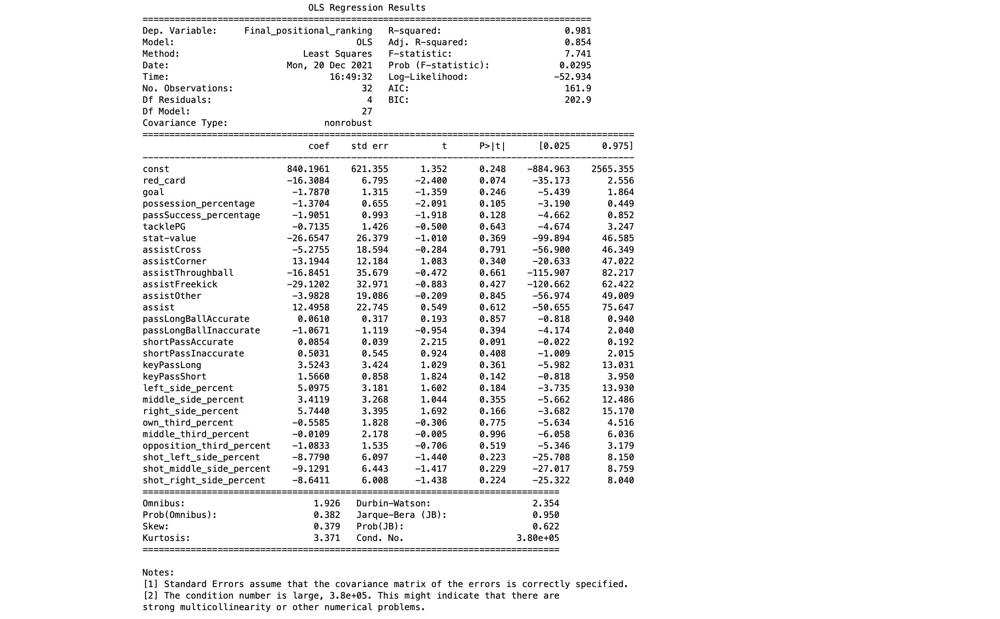

In [351]:
display(Image(filename="/project/Regression 1 - All Football Variables.png"))

In our regression above, there aren't any very significant variables affecting the final ranking position. We therefore, decided to remove the variables regarding the positions which were in percentages.

In [ ]:
# variables
X = all_football_18[['red_card','goal','possession_percentage',
                     'passSuccess_percentage',
 'tacklePG',
 'stat-value',
 'assistCross',
 'assistCorner',
 'assistThroughball',
 'assistFreekick',
 'assistOther',
 'assist',
 'passLongBallAccurate',
 'passLongBallInaccurate',
 'shortPassAccurate',
 'shortPassInaccurate',
 'keyPassLong',
 'keyPassShort']]
X = sm.add_constant(X)
Y = all_football_18['Final_positional_ranking']

# Regression 
model = sm.OLS(Y, X)
results = model.fit(cov_type=vcvtype)
print(results.summary())

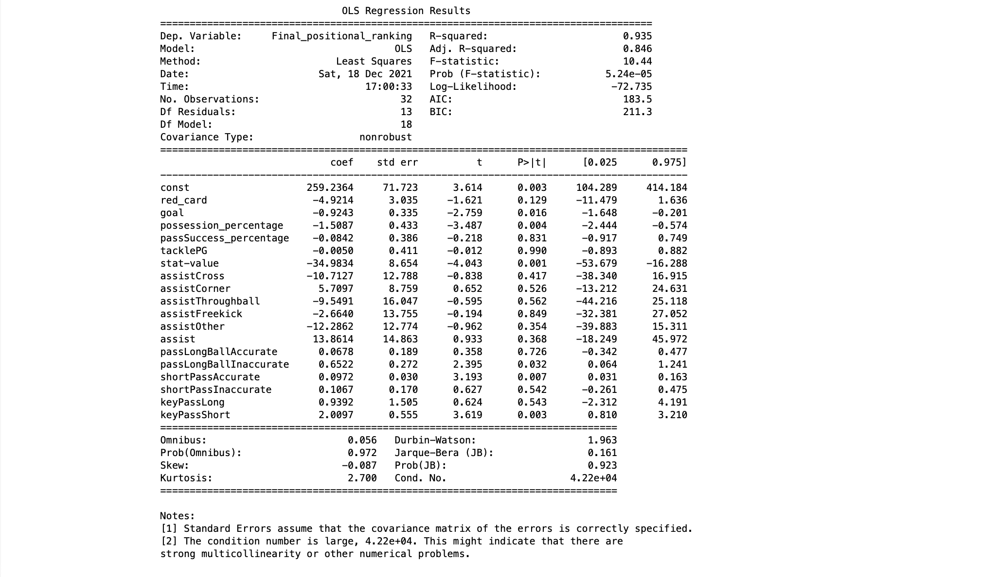

In [319]:
display(Image(filename="/project/Regression 2 - Football Percentages.png"))

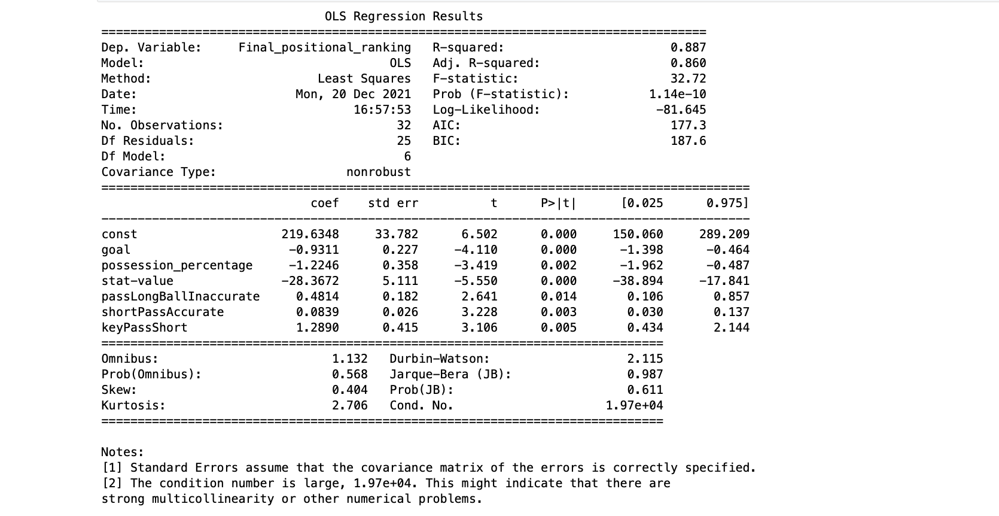

In [320]:
display(Image(filename="/project/Regression 3 - Significant Football Variables.png"))

Thanks to the last regression regression we identified the most important variables to be *goal*, *possession_percentage*, *stat-value*, *passLongBallInaccurate*, *shortPassAccurate* and *keyPassShort* which will be visualised in chapter 5.1.

### 4.2  <a class="anchor" id="4_2"></a> Temperature and market value variables

In [107]:
temdifference = pd.read_csv('/project/temdifference.csv', index_col=0)
all_football_18 = pd.read_csv('/project/all_football_18.csv', index_col=0)
market_value_all = pd.read_csv('/project/market_value_all.csv', index_col=0)
temdifference.head()
market_value_all.head()

,Country,AvgTemperature,TemperatureDifference
0,Argentina,9.730419,-8.818761
1,Australia,11.830601,-6.718579
2,Belgium,19.479053,0.929872
3,Brazil,19.686096,1.136916
4,Colombia,13.899818,-4.649362


,country,confederation,squad_size,avg_age,market_value_in_euros,market_value_digits,avg_market_value_of_players_in_mill_euros
0,Argentina,CONMEBOL,36,25.9,747.50 million,747,20.75
1,Australia,AFC,23,25.6,32.85 million,32,1.39
2,Belgium,UEFA,23,27.8,419.00 million,419,18.22
3,Brazil,CONMEBOL,23,26.5,870.50 million,870,37.83
4,Colombia,CONMEBOL,26,28.5,282.95 million,282,10.85


In [108]:
# The final position of country teams should be included in dataset to act as the dependent variable
temdifference = temdifference.join(all_football_18['Final_positional_ranking'])
temdifference.head()

,Country,AvgTemperature,TemperatureDifference,Final_positional_ranking
0,Argentina,9.730419,-8.818761,16
1,Australia,11.830601,-6.718579,25
2,Belgium,19.479053,0.929872,3
3,Brazil,19.686096,1.136916,5
4,Colombia,13.899818,-4.649362,10


In [109]:
market_value_all = market_value_all.rename(columns = {"country":"Country"})

regression = pd.merge(temdifference, market_value_all, on = "Country", how = "left")
regression.head()

,Country,AvgTemperature,TemperatureDifference,Final_positional_ranking,confederation,squad_size,avg_age,market_value_in_euros,market_value_digits,avg_market_value_of_players_in_mill_euros
0,Argentina,9.730419,-8.818761,16,CONMEBOL,36,25.9,747.50 million,747,20.75
1,Australia,11.830601,-6.718579,25,AFC,23,25.6,32.85 million,32,1.39
2,Belgium,19.479053,0.929872,3,UEFA,23,27.8,419.00 million,419,18.22
3,Brazil,19.686096,1.136916,5,CONMEBOL,23,26.5,870.50 million,870,37.83
4,Colombia,13.899818,-4.649362,10,CONMEBOL,26,28.5,282.95 million,282,10.85


In [ ]:
X = regression[["TemperatureDifference", "avg_age", "avg_market_value_of_players_in_mill_euros"]] # independent variables
X = sm.add_constant(X)
Y = regression["Final_positional_ranking"] # dependent variable
model = sm.OLS(Y,X)
results = model.fit(cov_type=vcvtype)
print(results.summary())

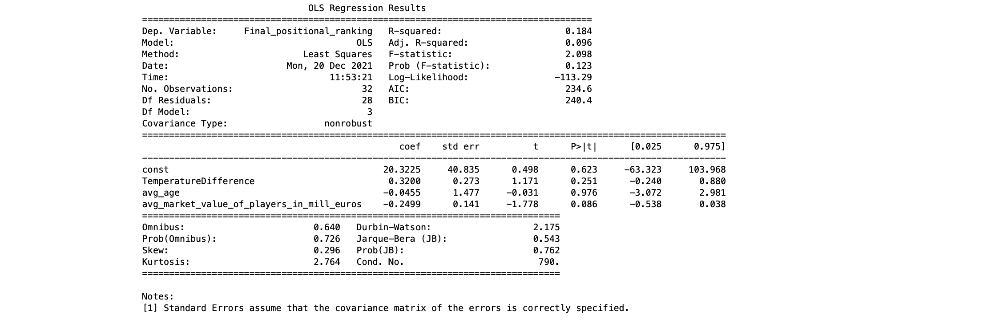

In [321]:
display(Image(filename="/project/Regression 4 - Temperature, Market Value.png"))

Only average market value of players in each country team is statistically significant at 10% significance level. Holding anything else constant, increasing 1 million euros in average market value of team players would move the rank forward by 0.2499 on average.

It can be found that R-squared is quite low as well (i.e. 0.184) which means those independent variables put in the model did not explain the variation of the dependent variable (i.e. final ranking) very well.

## Chapter 5: <a class="anchor" id="chapter5"></a> Data visualisations

### 5.1 <a class="anchor" id="5_1"></a> Histograms

From the 5 histograms below, we can draw conclusions, conflicting with the actual final positional ranking. Brazil has the most accurate players with a low percentage of inaccurate long passes and a high percentage of accurate short passes. The two worst-performing countries from the 10 finalists are Russia, followed by Sweden, while actually, the last 2 countries closing the top 10 were Mexico and Colombia. Hence, there is no linear relationship between the most significant football variables and the country’s final position in the World Cup.

This also applies to the number of total goals scored by each country. Although it seems like the only histogram with a pattern, it is misleading, as countries with higher final positions played more matches due to not being eliminated.

The average percentage of possession chart seems to have nearly a unified distribution, which makes sense - one would expect best teams to have a nearly 50:50 ratio. However, there is a pattern: Russia, with the lowest possession percentage, has also the lowest numbers both in accurate short passes and key short passes that were close to the opponent’s goalkeeper. 

To sum up, the most significant football variables seem to be interdependent rather than individually affecting the final position of a country. For instance, in order to have a higher possession percentage, the Russian team should practice precision of their short passes under pressure.

In [ ]:
fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(3,2,1)
ax2 = fig.add_subplot(3,2,2)
ax3 = fig.add_subplot(3,2,3)
ax4 = fig.add_subplot(3,2,4)
ax5 = fig.add_subplot(3,2,5)

plt.subplots_adjust(wspace=0.3, hspace=0.6)

#Variables which are used by all subplots
x_pos = [1,2,3,4,5,6,7,8,9,10]
countries = list(df_finalists["country_name"])

#ax1 - goals
winners_goals = list(df_finalists["goal"])

ax1.bar(x_pos, winners_goals, color ='b', width = 0.8, align = 'center')
ax1_xlab = 'Countries'
ax1_ylab = 'No of Goals'
ax1_title = ("Top 10 Finalists' Goals")
_ = ax1.set_xlabel(ax1_xlab)
_ = ax1.set_ylabel(ax1_ylab)
ax1_xticks = ax1.set_xticks(x_pos)
ax1_labels = ax1.set_xticklabels(countries, rotation=45)
ax1.title.set_text(ax1_title)


#ax2 - possession 
winners_possession = list(df_finalists["possession_percentage"])

ax2.bar(x_pos, winners_possession, color ='b', width = 0.8, align = 'center')
ax2_xlab = 'Countries'
ax2_ylab = 'Possession %'
ax2_title = ("Top 10 Finalists' Possession Percentage")
_ = ax2.set_xlabel(ax2_xlab)
_ = ax2.set_ylabel(ax2_ylab)
ax2_xticks = ax2.set_xticks(x_pos)
ax2_labels = ax2.set_xticklabels(countries, rotation=45)
ax2.title.set_text(ax2_title)


#ax3 - keyPassShort
winners_keyPassShort = list(df_finalists["keyPassShort"])

ax3.bar(x_pos, winners_keyPassShort, color ='b', width = 0.8, align = 'center')
ax3_xlab = 'Countries'
ax3_ylab = 'Key Short Passes'
ax3_title = ("Top 10 Finalists' Key Short Passes")
_ = ax3.set_xlabel(ax3_xlab)
_ = ax3.set_ylabel(ax3_ylab)
ax3_xticks = ax3.set_xticks(x_pos)
ax3_labels = ax3.set_xticklabels(countries, rotation=45)
ax3.title.set_text(ax3_title)


#ax5 - PassLongInaccurate
winners_pass_long_inac = list(df_finalists["passLongBallInaccurate"])

ax4.bar(x_pos, winners_pass_long_inac, color ='b', width = 0.8, align = 'center')
ax4_xlab = 'Countries'
ax4_ylab = "Inaccurate Long Passes"
ax4_title = ("Top 10 Finalists' Inaccurate Long Passes")
_ = ax4.set_xlabel(ax4_xlab)
_ = ax4.set_ylabel(ax4_ylab)
ax4_xticks = ax4.set_xticks(x_pos)
ax4_labels = ax4.set_xticklabels(countries, rotation=45)
ax4.title.set_text(ax4_title)


#ax6 - PassShortAccurate
winners_pass_short_ac = list(df_finalists["shortPassAccurate"])

ax5.bar(x_pos, winners_pass_short_ac, color ='b', width = 0.8, align = 'center')
ax5_xlab = 'Countries'
ax5_ylab = "Accurate Short Passes"
ax5_title = ("Top 10 Finalists' Accurate Short Passes")
_ = ax5.set_xlabel(ax5_xlab)
_ = ax5.set_ylabel(ax5_ylab)
ax5_xticks = ax5.set_xticks(x_pos)
ax5_labels = ax5.set_xticklabels(countries, rotation=45)
ax5.title.set_text(ax5_title)

plt.savefig("Subplots.png")
plt.show()

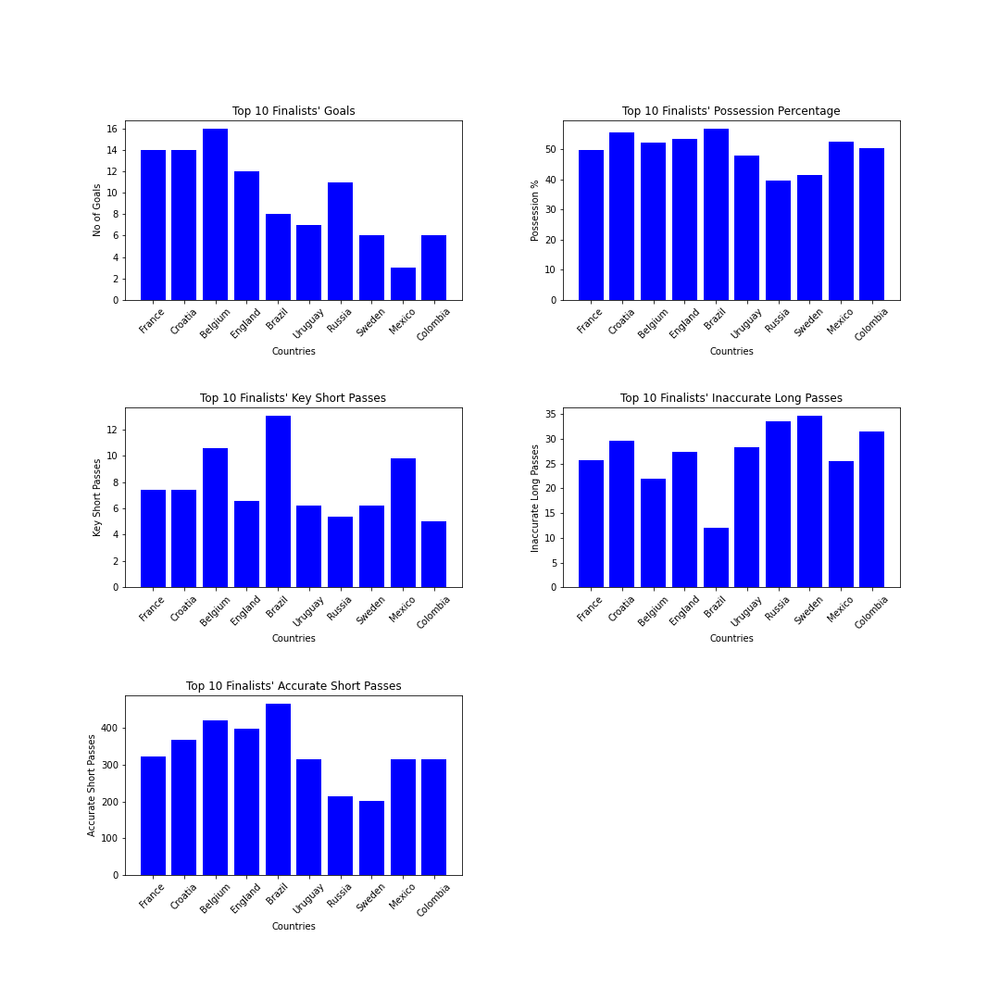

In [324]:
display(Image(filename='Subplots.png'))

Figure 4: Histograms Visualising Top 5 Football Variables Affecting Success of the Game

### 5.2 <a class="anchor" id="5_2"></a> World map

We created a map representing the difference in temperature between the participating countries and the Football Cup host country, Russia. From the figure below, it can be concluded that the 10 finalists of the World Cup have average temperatures close to the ones in Russia or even a bit colder leading to higher chancs for a better final position. This may be explained by smaller time lag for footballers to adopt to the new local climate. Possibly, such factors as warmer sportswear may also have had an incremental effect on sportsmen's performance. 

In [ ]:
# read in example geodataframe using geopandas datasets
#world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

fig, ax = plt.subplots(figsize = (20,20))
world.boundary.plot(edgecolor=u'white', color='lightgray', ax=ax)

list_countries = list(demo_map['CountryName'])

#This assigns one colour to all countries
trial.loc[trial['name'].isin(list_countries)].plot(edgecolor=u'white', color="lightblue", ax=ax)

trial.plot(column = 'TemperatureDifference',
           cmap = 'Oranges',
           ax = ax,
           legend = True, 
          legend_kwds = {'label': "Temperature in Celsius ($^\circ$C)",
                   'orientation': 'vertical',
                   'shrink': 0.35})

#ax.legend(loc=2,fontsize=10)
ax.legend()
fig.suptitle('Temperature difference per country'+"\n"+'compared to Russia', y=0.68, x=0.45 , fontsize=24);

plt.savefig('/project/Visualisation_graphs/Map_TempDiff.png')
plt.show()

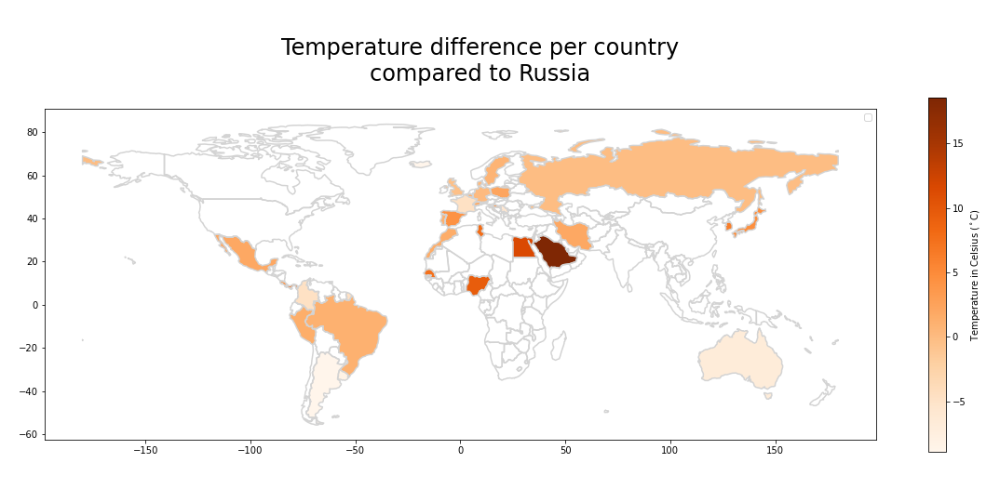

In [365]:
display(Image(filename="/project/Visualisation_graphs/Map_TempDiff.png"))

Figure 5: World Map

### 5.3 <a class="anchor" id="5_3"></a> Rankings

Using a Radar Chart, we analysed the position variables for the 1st team (France) and the last team (Panama), to understand any differences that could influence the outcome of the game. It was observed that France held the ball dominantly on the right side of the field, with more shots on the right side of the pitch and had the ball more on the opposition side of the pitch. While for Panama, they held the ball dominantly on the left side of the field. We can infer that as most players have the right foot as their dominant foot (~79%) (Journal of Sports Sciences, 2021), it would be advantageous to dominate the right side of the field. Further analysis would be needed for more concrete assumptions. 

In [ ]:
categories = ['left_side_percent',
 'middle_side_percent',
 'right_side_percent',
 'own_third_percent',
 'middle_third_percent',
 'opposition_third_percent',
 'shot_left_side_percent',
 'shot_middle_side_percent',
 'shot_right_side_percent']

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=spider_chart.loc[10]["left_side_percent":"shot_right_side_percent"],
      theta=categories,
      fill='toself',
      name='France',
    textfont_size=1
))

fig.add_trace(go.Scatterpolar(
      r=spider_chart.loc[18]["left_side_percent":"shot_right_side_percent"],
      theta=categories,
      fill='toself',
      name='Panama',
     textfont_size=1
))


fig.update_layout(
     title={
        'text': "Radar chart of France and Panama's positions",
        'y':0.93,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
  polar=dict(
    radialaxis=dict(visible=True)),
  legend=dict(
    yanchor="bottom",
    y=0.9,
    xanchor="right",
    x=0.25),
  showlegend=True
)

plt.show()

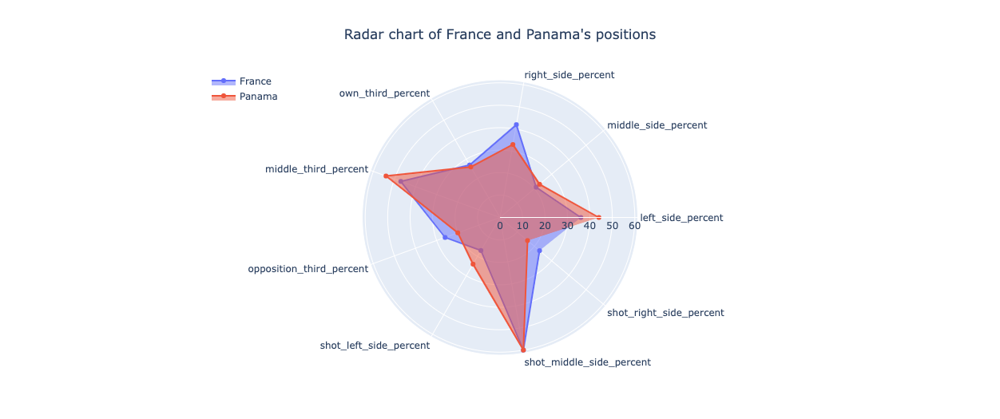

In [366]:
display(Image(filename="/project/Visualisation_graphs/newplot_radar.png"))

Figure 6: Radar Chart of France and Panama's positions

After comparing the actual ranking of WorldCup with the ranking we computed based on the important variables, we can conclude that Belgium was estimated to finish 1st and France 3rd (Figure 7). Nevertheless, our estimation was partially accurate, as Panama came in last position (32nd), as estimated. 

In [ ]:
fig = plt.figure(figsize=(15,15))

plt.grid(visible=True)

df1 = pd.DataFrame({"Position Ranking":ranking_table["Final_positional_ranking"], "Countries":ranking_table["country_name"]})
df2 = pd.DataFrame({"Position Ranking":ranking_table["Ranking_after_analysis"], "Countries":ranking_table["country_name"]})

df1['Legend']="Actual_positional_ranking"
df2['Legend']="Ranking_after_analysis"

res=pd.concat([df1,df2])
sns.barplot(y='Position Ranking',x='Countries',data=res,hue='Legend')
_ = plt.yticks(range(len(y)+1))
_ = plt.xticks(rotation = 45)
plt.title("World Cup 2018 ranking")

plt.savefig("/project/Visualisation_graphs/world_cup_ranking_comparison.png")
plt.show()

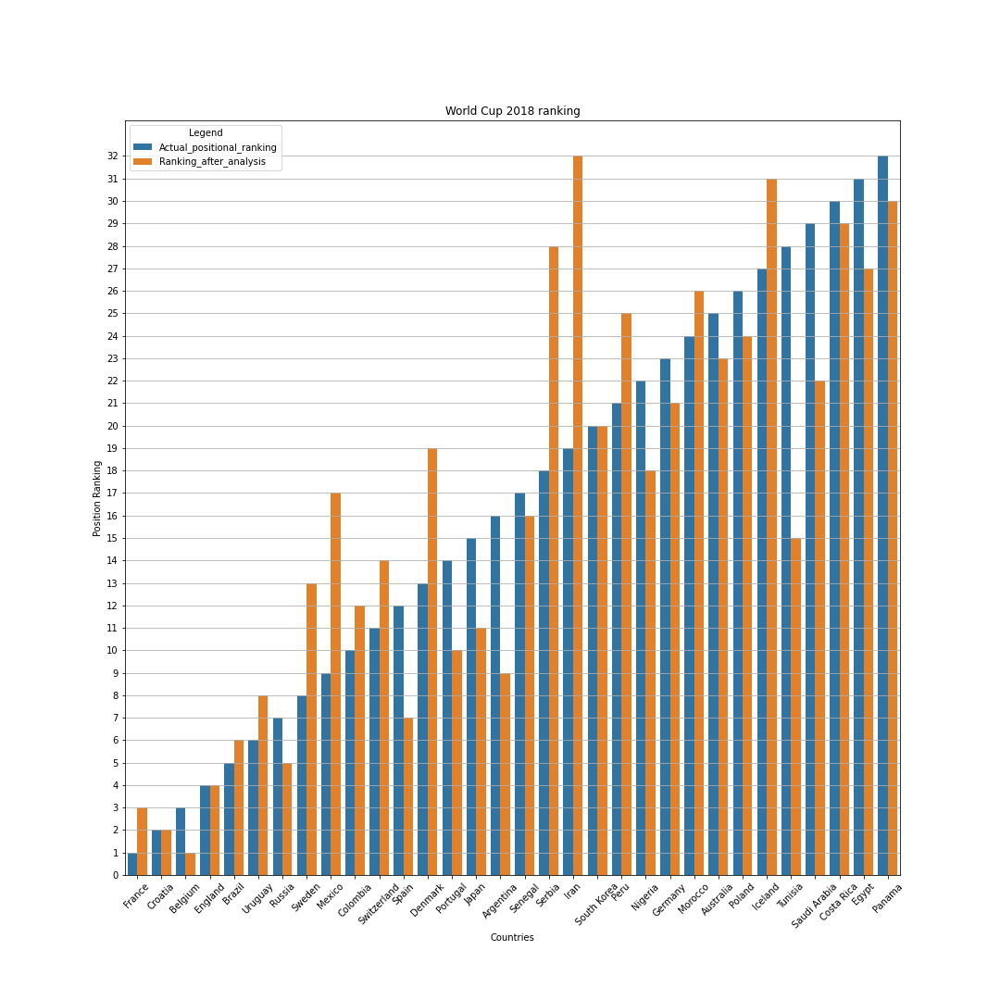

In [367]:
display(Image(filename="/project/Visualisation_graphs/world_cup_ranking_comparison.png"))

Figure 7: Histogram for World Cup Ranking Comparison

### 5.4 <a class="anchor" id="5_4"></a> Decision trees

Decision tree finds the best splits at each node. We can see that the most important variable is the *PassLongBallInaccurate*. This means that countries should focus on the accuracy of their long ball passes as it can be a crucial factor for their performance. Furthermore, as expected, goals are the second important variable meaning that the more a country scores, the better.

In [ ]:
ranking_table_X = ranking_table[["possession_percentage",
                                 "goal",
                                 "passLongBallInaccurate",
                                 "shortPassAccurate","keyPassShort"]]

ranking_table_y = ranking_table.country_name

tree_clf = DecisionTreeClassifier(max_depth=5, random_state = 1)
#by adding a random_state is to make the outcome consistent across calls
# otherwise, we would have had different outputs as it's random 
clf = tree_clf.fit(ranking_table_X, ranking_table_y)
clf

labels = ranking_table_X.columns

graph = Source(tree.export_graphviz(tree_clf ,feature_names = labels, class_names = ranking_table_y.unique(), max_depth = 4, filled = True))
display(SVG(graph.pipe(format='svg')))

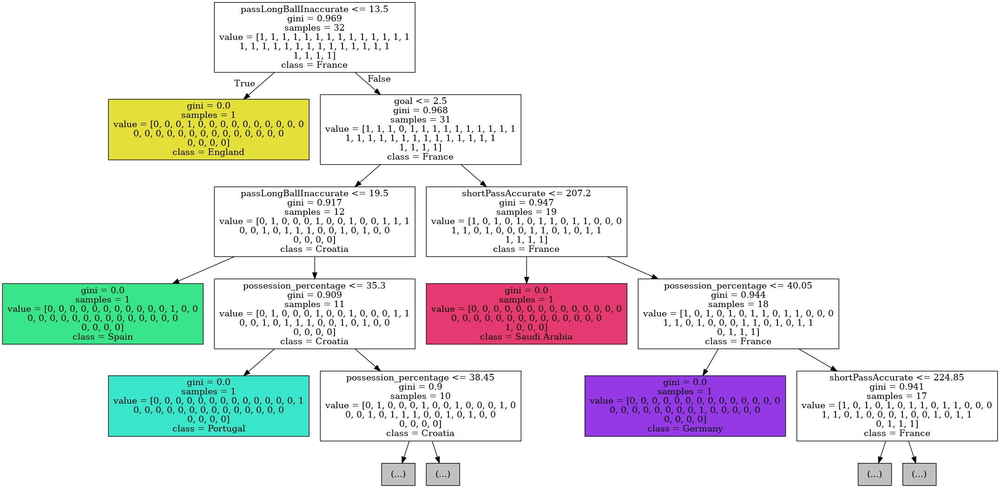

In [220]:
display(Image(filename="/project/dtree_pipe.png"))

Figure 8: Decision Tree for football variables

## Chapter 6: <a class="anchor" id="chapter"></a> Evaluation & limitations

After our analysis, the notational factors that influence the success of the winning team in the World Cup are *goal*, *possession_percentage*, *passLongBallInaccurate*, *ShortPassAccurate* and *KeyPassShort*. At a 10% significance level, the average market value of players is statistically significant. Holding everything else constant, increasing the average market value of team players by 1 million euros would move the rank forward by 0.2499 on average. Countries can focus on these identified targeted areas to increase their chances of success. However, the temperature difference and average age of players are statistically insignificant, and it can not be concluded that they would influence the success of the game. 

From the analysis, based on these factors, Belgium had the best performace and should have won the 2018 World Cup. However, France was the actual winner of the World Cup, and Belgium came in 3rd position. This indicates that other factors not included in our analysis could have influenced the team's success, such as the amount of time spent training. However, Panama came in last position (32nd), as estimated.

Additionally, there are certain qualitative factors which can influence the game but are difficult to measure and assess, such as aspects of behaviour and mental state (Google Books, 2011). Other residual factors include uncertainties that may arise such as emotions. Therefore, this is a constraint for the accuracy of our analysis. 

Finally, the scope of our analysis was limited to the World Cup 2018, and data was obtained from independent sources, not officially recognised. The scope of our data limited us in dividing our dataset to a training and a testing one in order to build an accurate predictive model using machine learning algorithms. Expanding our analysis to include more robust, historical data would improve the prediction accuracy. Furthermore, we were limited in the accuracy of our decision tree, as we chose a specific random seed to output the same result each time to be easier for our analysis. To have a more accurate model, we should have run more decision trees in order to compare the accuracy between them.

## Chapter 7: <a class="anchor" id="chapter7"></a> Conclusion

Overall, given more time and more access to data, we can expand the scope of our analysis, to predict the winning team with near-accuracy (taking into context the residual term). This analysis can also be replicated and re used in future analysis.

## Chapter 8: <a class="anchor" id="chapter8"></a> References

Akshaychavan (2016). Average Temperature per country per year. [online] Kaggle.com. Available at: https://www.kaggle.com/akshaychavan/average-temperature-per-country-per-year/data [Accessed 6 Dec. 2021].

Google Books. (2011). Handbook of Soccer Match Analysis. [online] Available at: https://books.google.co.uk/books?id=Lfqq6NdzA3QC&printsec=frontcover#v=onepage&q&f=false [Accessed 5 Dec. 2021].

Martin, W. (2018). Ranked: How much each team at the 2018 FIFA World Cup is worth. [online] Business Insider. Available at: https://www.businessinsider.com/how-much-each-team-at-the-world-cup-is-worth-2018-6?r=US&IR=T#32-panama-1 [Accessed 11 Dec. 2021].

McKeown, M., Roy, A. and Spandler, H. (2015). “You’ll never walk alone”: Supportive social relations in a football and mental health project. International Journal of Mental Health Nursing, [online] 24(4), pp.360–369. Available at: https://onlinelibrary.wiley.com/doi/full/10.1111/inm.12122?casa_token=iEHdkBbDcUwAAAAA%3AEFJzHzAMHr5pUL6HUupkVsRqPtP3pvmzYuvK6OjVLJ89ujW7T2fuQdS6ig7ny-umkvDABDAmzxGYJQ [Accessed 5 Dec. 2021].

Rein, R. and Memmert, D. (2016). Big data and tactical analysis in elite soccer: future challenges and opportunities for sports science. SpringerPlus, [online] 5(1). Available at: https://springerplus.springeropen.com/articles/10.1186/s40064-016-3108-2 [Accessed 5 Dec. 2021].

Shvili, J. (2020). The Most Popular Sports In The World. [online] WorldAtlas. Available at: https://www.worldatlas.com/articles/what-are-the-most-popular-sports-in-the-world.html [Accessed 5 Dec. 2021].

Statista. (2018). FIFA World Cup 2018 | Statista. [online] Available at: https://www.statista.com/study/38467/fifa-world-cup-2018/ [Accessed 5 Dec. 2021].

Subham Surana (2020). Temperature of All Countries (1995-2020). [online] Kaggle.com. Available at: https://www.kaggle.com/subhamjain/temperature-of-all-countries-19952020 [Accessed 6 Dec. 2021].

TimesofIndia.com (2018). FIFA World Cup 2018 Schedule: Groups, Matches, Dates, Results. [online] The Times of India. Available at: https://timesofindia.indiatimes.com/sports/football/top-stories/fifa-world-cup-2018-full-schedule-groups-matches-dates-venues/articleshow/64205854.cms#:~:text=All%20of%20the%20FIFA%20World%20Cup%202018%20match,venues%20located%20in%2011%20cities%20across%20the%20country. [Accessed 5 Dec. 2021].

Transfermarkt.de. (2021). Die wertvollsten A-Nationalmannschaften (Detailansicht). [online] Available at: https://www.transfermarkt.de/vereins-statistik/wertvollstenationalmannschaften/marktwertetop?kontinent_id=0&plus=1 [Accessed 5 Dec. 2021].

Whoscored.com. (2021). FIFA World Cup Final Team Statistics | WhoScored.com. [online] Available at: https://www.whoscored.com/Regions/247/Tournaments/36/Seasons/5967/Stages/12763/TeamStatistics/International-FIFA-World-Cup-2018 [Accessed 5 Dec. 2021].

## Chapter 9: <a class="anchor" id="chapter9"></a> Appendix

### 9.1 <a class="anchor" id="9_1"></a> Trello board

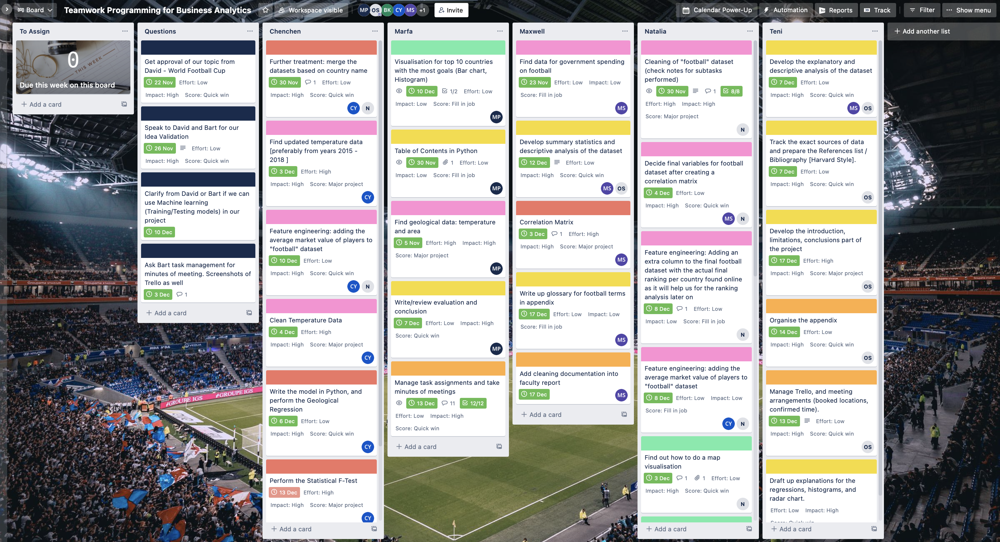

In [325]:
display(Image(filename="/project/Appendix/Trello final.png"))

Figure 9: Final Trello Colour-Coded Board

In [336]:
Trello_Legend = pd.read_excel("/project/Appendix/Trello_Interpretation.xlsx",index_col = 0)
Trello_Legend

,Color Code
Task,
"Data sourcing, cleaning, and warngling",Lilac
Statistical tasks,Red
Writing tasks,Yellow
Project management,Orange
Questions,Blue


### 9.2 <a class="anchor" id="9_2"></a> Room bookings

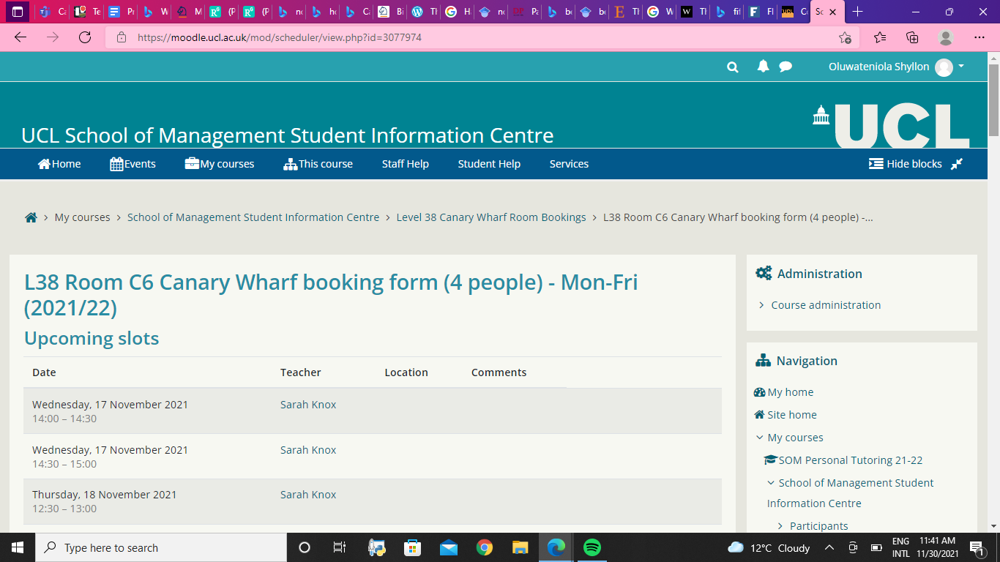

In [327]:
display(Image(filename="/project/Appendix/Room_bookings.png"))

Figure 10: Room Bookings Confirmation

### 9.3 <a class="anchor" id="9_3"></a> Minutes of the meetings

**W4: 27/10 (Wed) - Programming lecture, 10:30**


- Group topic brainstorming:
    - To what extent does TikTok demographic influence music trends?
    - creating value for music producers/musitions: What could music producers focus on to be more popular on TikTok, and hence, on overall music arena? - this is our answer to the question
    - evaluation: jump of active TikTok users in march 2020 - because of the nation lockdowns 
    - geography: UK or Europe?

- Trello screenshots each week for project management in appendix with a link inside the PDF
- First deliverable: review project plan with TA in week 5 (next Friday!)



APPROXIMATE PROJECT TIMELINE

Due W5 Friday (5/11):
1. identify problem
2. find some data: identify size/ level of analysis
3. identify roles
4. write up report (describe stuff) & insert new Trello sc in appendix

Due W6 Friday (12/11):
1. data cleaning
2. data structure
3. redefine research question
4. write up report & insert new Trello sc in appendix

W7-W8 (26/11):
1. visualisations (Matplotlib, Tableau)
2. analyse data
3. write up report & insert new Trello sc in appendix

W9 (3/12):
1. draw conclusions
2. write evaluations
3. insert new Trello sc in appendix

W10 (10/12):
1. convert Notebook to PDF
2. brush up
3. test/review
4. submit due 14/12


**W4: 29/10 (Fri) - TA session, 9:00**

Maxwell and Teni spoke to Bart on Friday and breezed him through our idea; he thought it was quite interesting, but was more worried about the type and quality of data we would get, as he wanted us to work with raw data for our analysis (as with David (I asked)). He left some alternative data sources for us on the Teams Chat.

Step 1:
This weekend, we go over the data sources provided by the TA. We also go over any other possible data sources we can find, and note them down in the Word Document I have in the Teams.

We all just do solid quality work and come with useful stuff.

Pro tip - when trying to access the document, refresh, so ideas of others come up.

Achilles heel - us getting the same type of data (although rare) is possible. 

Way Forward - when everyone is done with a set of data searches (I.e you’ve put in some stuff on the doc).

Leave a message here on the type of data you found.

E.g., Spotify data on music for the past 2 years, plus demographics: just a two-liner summary.


Step 2:
We meet on Monday after class, and run through our idea. Everybody has an idea on the data they uploaded, and we all speak about it and decide if the sufficient data is enough to carry us.
Otherwise we reroute.

We also speak about:
Task assignments
Strengths of each member of the team
And further plans for our work

Teni updates the Trello,
Our Secretary, Marfa keeps notes on the conversation.

Steps 3, 4, 5 would be decided after all this.


**W5: 01/11 (Mon) - Face-to-face collaboration, 12:30**

Updated report sections on Trello that are up for the grabs. Marfa suggested most technical people to take up sections 4-7 and most humanitities-oriented people to take the word-heavy parts (1-3, 8)
Emails were shared, so that everyone was  added to the collaborative Google Doc.

There 10 tasks and 5 people, so we got to do 2 tasks each. Everyone writes up their own appendix if they refer to it in their section. Marfa changed our decision tree task to regional data, assuming we'll find a legit geo dataset with latitudes and longitudes of different countries.

Scheduled a brief meeting for the next day to split the tasks and responsibilities.

Spotify project is rejected by David.
Football Cup project is approved by David.


**W5: 02/11 (Tue) - Brief face-to-face meeting, 15:00**

Responsibilities were split in our collaborative Google Doc.

Documented ideas for football datasets:
1. Number of stadiums per country
2. Attitudes towards football per country (fans or neutral)
3. Distance to stadiums
4. Football teaching centers per country


**W5: 05/11 (Fri) - Online meeting, 12:30**

1. Updated each other on datasets that were found so far: Maxwell’s data source did not work out.
2. Found a UN table with country codes, regions and level of development! Imported it to CSV.
3. Found geological datasets (average temperatures over 20 years, dataset rejected in the end).
4. Agreed to only focus around 1 year (the football cup one) instead of 4 years of training.


**W8: 25/11 (Thu) - Face-to-face meeting, 14:00**

1. Created project report structure.
2. Started sorting our references.
3. Identified which statistical and visual tasks we are going to perform.
4. Agreed on questions to be asked next TA session.


**W8: 2/11 (Fri) - TA session, 9:00**

Natalia and Teni joined the call and clarified with Bart the following questions:

1. We need to update Trello regularly as at the end they can see if all the updates were done in one day or during all these weeks. I believe these are easy 15 points so let's make sure we get full marks on it.  Can someone be in charge of it, maybe to add tasks or remind everyone to update their tasks? Also could you please reshare the link in teams so that Bart can see it too and he can check?

Some more technical bits:
2. It will be good if we could create a new column(s) based on other features like combining them together. We need to first look at their correlation as we shouldn't combine two features that are strongly correlated with each other. Like that we show that we use feature engineering. In the end, the new column might be useful or not. In both cases, it's a result and we show that technical bit. 
3. or the map with the countries it's possible and he said it's a nice visualisation! He said that we will need to find the coordinates of the capital from each country for example and then we would be able to colour the country and add more things. Natalia can have a look at how to do this. It could be a map visualisation per temperature on each country and/or also maybe by how many times they have won. Any ideas are perfect!
4. Ranking is a good idea to compare it with the actual tanking. Select variables from our dataset, see the ranking of the teams being better and compare it with the actual ranking as discussed in our meeting yesterday too.
5. Bart said it's a good idea overall!

Tasks to do due next meeting:

1) Trello
a) update it with the latest tasks
b) put Trello link in teams for  Bart to see as well 
c) take screenshots of progress so far and upload it on faculty to not lose them or save it somewhere)
 --> Marfa, Teni

2) Other project management items 
--> Marfa, Teni

3) Clean the datasets that we already have
a) merge them together 
b) check which variables we need to focus on mostly 
c) other cleaning items
--> Chenchen, Natalia 

4) Look for a dataset (if we can)
a) to see how much each country spends on sports/football
b) actual ranking of world cup 2018/2014 
--> Max

6) Decided on which world cup to focus on 2018 rather than 2014, as we have more data on it, and it’s more relevant/recent.


**W9: 30/11 (Tue) - Face-to-face meeting, 16:00**

TASKS TO DO DUE THURSDAY, 1PM (ROOM C6, 38)
Chapter 2: Data prep
- Find an updated average temperature dataset for our 32 countries. Guideline: 2015-2018 (Chenchen)

Chapter 3: Explanatory analysis of the final dataset
- Variable description in dataset description (Teni)
- Estimate an average market data for Panama (Teni)
- Merge all datasets together (Natalia)

Chapter 5: Data visualisation
- Map visualisation is failed for now, but will ask Bart on Friday (Natalia)
- Box plot generalisation of the data (Maxwell?)

Chapter 11.1: Appendix
- Trello board update (Teni + Marfa)

Just so that I don't get attacked, Teni and I discussed the workload balance for this week, and since I'm going to take on visualisations after our datasets are merged. Hence, I'm compiling everything in the report for now and asking any questions that you guys may have :)


**W9: 02/12 (Thu) - Face-to-face meeting, 13:00**

Tasks due Tuesday 7 Dec, 15:30:

Natalia: Regional data (map)
- Temperature differences
- Market value

Marfa: Bar charts: football variables
- Top 10 countries who scored the most goals
- Attempt other football-related 
- Edit report as much as possible

Chenchen: temperature dataset
- Convert all units to celsius
- Feature engineering: create a new column calculating a difference between the average country's temperature and the football cup host's average temperature this year.

Teni: wordy and project management stuff
- Confirm sources from Kagoo and put them in references list
- References in Harvard style
- Ask Bart everything tomorrow morning

Maxwell:
- Variables table
- Glossary in Appendix

Next week, due Friday 10/12 (after acquiring a final clean dataset):
- Regressions
- Rankings
- Decision Trees

Planning:
1. Over next weekend (10-12 Dec) - Marfa, Teni, Maxwell write up the report about the technical bits that were done.
2. Mon, 13/12 - All teammates review the report, final touches 
3. Tue, 14/12 - Final deadline


W10: 07/12 (Tue) - Face-to-face meeting, 16:00
1. Reviewed what has been done so far
2. Shared suggestions about improvements on visualisations
3. Updated visualisations variety


**W11: 13/12 (Mon) - Online meeting, 11:30**
1. Our ranking says that Belgium should have been first.
2. Include unobserved variables in limitations like mood, luck, slippery grass.
3. Discussed what needs to be put into the final report.

### 9.4 <a class="anchor" id="9_4"></a> Word count proof

When calculating the final word count, we "hashed out" all markdown cells not to be considered by temporarily converting them into code cells. If you run the code below, it will give a word count including all heading, table of contents, subheadings,figure annotations, references, and appendix. When they all are converted into code cells, out word count is indeed 1934 words, as shown in Figure 11. 

In [364]:
#word count code
def nb_word_count(nb_path):
    with io.open(nb_path, 'r', encoding='utf-8') as f:
        nb = current.read(f, 'json')
        word_count = 0
        for cell in nb.worksheets[0].cells:
            if cell.cell_type == "markdown":
                word_count += len(cell['source'].replace('#', '').lstrip().split(' '))
    return word_count
nb_word_count("/project/Report.ipynb")

1940

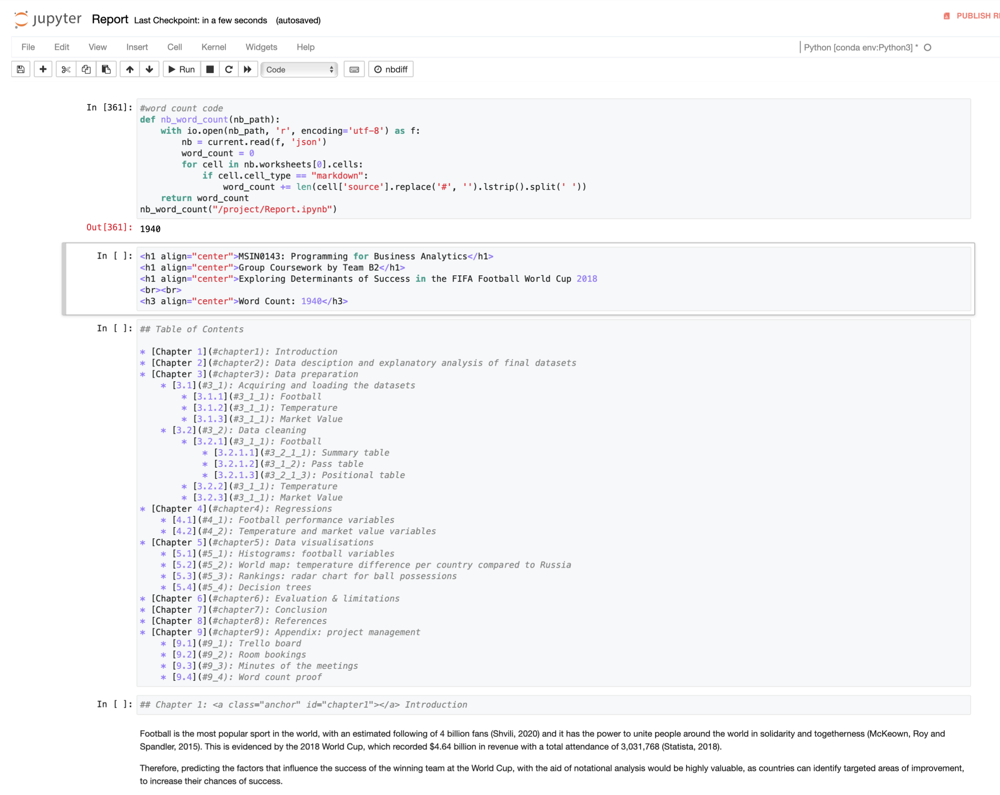

In [362]:
display(Image(filename="/project/Appendix/Word_Count.png"))

Figure 11: Word Count Proof